# AgriVision:  Capstone Project

## Unlock the future of sustainable farming by harnessing deep learning to classify agricultural and non-agricultural lands from satellite images

### Project Pipeline:

- Data Collection: Gathering satellite images and its respective mask that classify agricultural and non-agricultural lands

- Data Preprocessing: Cleaning the images and its respective mask and preparing it for segmentation

- Segmentation: Using SLIC method from the skimage library to segment the satellite images

- Graph Construction and Feature Extraction: Convert the segments to a graph structured data while applying feature extraction from ResNet50 model

- Building the GNN Model: Creating a custom GraphSage architecture from pytorch-geometric library

- Training: Start training the model using BCELoss for binary classification

- Evaluation: Observe the performance of the model using sklearn library

- Deployment: Save the model for deployment once everything is fixed

### Importing Necessary Libraries

In [1]:
import matplotlib.pyplot as plt
import colorsys
from skimage import io
from skimage import color
from skimage import segmentation
from PIL import Image
import imageio
import cv2
import numpy as np
import os
from skimage.util import img_as_float, img_as_int,img_as_bool
from skimage.segmentation import mark_boundaries
from skimage.segmentation import find_boundaries, join_segmentations
from skimage import data, segmentation, color, filters, io, graph, measure
from skimage.measure import regionprops,label
from keras.applications.resnet import preprocess_input #ResNet50
import networkx as nx
from torchvision import transforms
from keras.applications import ResNet50
import torchvision.models as models
from tqdm import tqdm

### Load the Satellite Images and Masks

There are two ways to load the data:

- Google Drive

- Local Directory

In [ ]:
# Google Drive
#from google.colab import drive
#drive.mount('/content/drive')

# Define the path to your working directory
#cd = '/content/drive/My Drive/Thesis'

In [ ]:
# Local Directory
cd = os.getcwd()
print(cd)

In [2]:
new_mask_path = '/kaggle/input/capstone/mask_img-20250108T122341Z-001/mask_img'
new_sat_path = '/kaggle/input/capstone/Sat Folder-20250108T123123Z-001/Sat Folder'

In [3]:
# This series of blocks of code is dedicated to looking for the individual files within the single folder and create new folders for their respective types

#initialize lists to separate masks and sat images
mask = list()
sat = list()
newmask = "Mask folder"
newsat = "Sat folder"

#create loop for separation
# for i in os.listdir(cd):
#     if os.path.isfile(os.path.join(cd, i)) and i.endswith(".png") or i.endswith(".jpg"):
#         if "mask" in i:
#             mask.append(i)
#         if "sat" in i:
#             sat.append(i)

#new_mask_path = os.path.join(cd,newmask)
#new_sat_path = os.path.join(cd,newsat)

In [4]:
#Accessing the file path of each satellite images and its mask

masks1 = []
for file in os.listdir(new_mask_path):
    if '.ipynb_checkpoints' in file:
        continue
    masks1.append(file)
    
sat1 = []
for file in os.listdir(new_sat_path):
    if '.ipynb_checkpoints' in file:
        continue
    sat1.append(file)

In [5]:
#Verify the files
masks1.sort()
sat1.sort()
print(len(sat1))
print(len(masks1))
      

803
803


### Data Preprocessing

- Verify each mask and transform it to two binary values representing yellow and cyan for agricultural and non agricultural lands

In [6]:

def cleaning_mask(current_index):
    grey = []
    sliced_mask = masks1[current_index: current_index + 10]
    for i in sliced_mask:
        masks4 = os.path.join(new_mask_path, i)
        masks5 = np.array(Image.open(masks4))
        truemask = np.copy(masks5)
        truemask = cv2.cvtColor(truemask,cv2.COLOR_RGBA2RGB)
        target = [0,255,255]
        yellow = [255,255,0]
        bluemask = np.all(truemask == target, axis = -1)
        truemask[~bluemask] = yellow
        truemask = cv2.cvtColor(truemask, cv2.COLOR_RGB2GRAY)
        a = True
        na = False
        truemask[truemask == 179] =  na #Blue
        truemask[truemask == 226] = a #Yellow
        grey.append(truemask.astype(bool))
    return grey

def convert_img_to_arr(current_index):
    color3 = []
    sliced_sat = sat1[current_index: current_index + 10]
    for j in sliced_sat:
        sat3 = os.path.join(new_sat_path, j)
        sat4 = img_as_float(io.imread(sat3))
        color3.append(sat4)
    return color3

In [8]:
cm = cleaning_mask(70)
sd = convert_img_to_arr(70)

In [9]:
~cm[0]

array([[False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

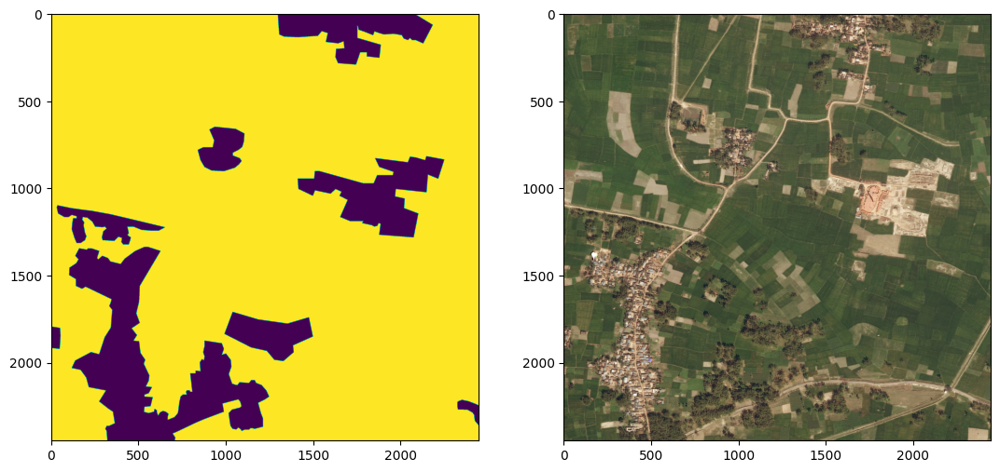

In [10]:
fig,ax = plt.subplots(1,2,figsize = (13,13))
ax[0].imshow(cm[5])
ax[1].imshow(sd[5])

In [ ]:

# # Verify the cleaned dataset
# print(f"Number of masks: {len(masks1)}")
# print(f"Number of satellite images: {len(sat1)}")


# for i in range(3):
#     print("")
#     print(f"Processing index {i}")
#     print(f"color3[{i}] shape: {color3[i].shape}")
#     print(f"grey[{i}] shape: {grey[i].shape}")
#     #print(f"grey1[{i}] shape: {grey1[i].shape}")

#### Visualization of Raw Mask and Cleaned Mask

In [ ]:
# dismask = os.path.join(new_mask_path, masks1[5])
# dismaskreal= np.array(Image.open(dismask))
# fig,ax = plt.subplots(1,2,figsize=(10,10))
# ax[0].imshow(dismaskreal)
# ax[1].imshow(~grey[5])

#### Visualizing Segmented Images by SLIC Method

In [11]:
def showimg(x):
    '''
    This method displays the segmented slic images

    x: int

    returns: matplotlib image

    x - is an integer value for indexing and accessing the slic and mask list
    '''
    print(np.unique(final_seg[x]))
    ddr4 = mark_boundaries(color3[x],final_seg[x])
    fig, ax = plt.subplots(1,3,figsize=(13,13))
    ax[0].imshow(ddr4)
    ax[0].contour(grey[x], colors = 'red', linewidths = 1)
    ax[1].imshow(ddr4)
    ax[2].imshow(grey[x])

### Segmentation

- Adjust the number segments depending on the area of each class

In [12]:
# The smaller the area of a class, the lower the number of segments
def count_true_pixels(mask):
  total_pixel = mask.size

  counts = np.bincount(mask.ravel())

  true_percent = (counts[0] / total_pixel)
  false_percent = (counts[1] / total_pixel)

  return [float(false_percent), float(true_percent)]

#### SLIC Segmentation

- Checking first if the mask has exactly one segment or one class because it would cause an error regarding slic segmentation

- Adjusting the number of segments based on the area of the class in a mask to avoid clustered nodes

- The maximum segments would be 50 segments both agricultural and non agricultural lands

- After preparing the correct parameters, we now then perform slic method for every satellite images 

In [13]:
def is_all_false(mask):
    return np.all(mask == 0)

def slic_segmentation(current_index,max_seg, color3, grey):
    segmented_images_a = []
    for i in range(0,10):
        #print(f" Current Segmentation A I = {i}")
        if is_all_false(grey[i]):
            #print(f"Creating blank segmentation for all-false mask at index {i}")
            blank_segmentation = np.zeros_like(color3[i][:, :, 0], dtype=int) # Create a blank segmentation 
            segmented_images_a.append(blank_segmentation)
        else:
            try:
                number_of_segments = [int(i * max_seg) if i >= 0.10 else 4 for i in count_true_pixels(grey[i])]
                segments = segmentation.slic(color3[i], n_segments=number_of_segments[0], mask=grey[i], start_label=1)
                segmented_images_a.append(segments) 
            except ValueError as e: 
                print(f"Error processing index {i}: {e}") 

    # Segmenting non-agriculture images 
    segmented_images_na = []
    for i in range(0,10): 
        #print(f" Current Segmentation NA I = {i}")
        if is_all_false(~grey[i]):
            #print(f"Creating blank segmentation for all-false mask at index {i}")
            blank_segmentation = np.zeros_like(color3[i][:, :, 0], dtype=int) # Create a blank segmentation 
            segmented_images_na.append(blank_segmentation)
        else:
            try: 
                number_of_segments = [int(i * max_seg) if i >= 0.10 else 4 for i in count_true_pixels(~grey[i])]
                segments1 = segmentation.slic(color3[i], n_segments=number_of_segments[0], mask=~grey[i], start_label=1) 
                segmented_images_na.append(segments1) 
            except ValueError as e: 
                print(f"Error processing index {i}: {e}")

    return segmented_images_a, segmented_images_na

Combine the two segmented images:

- Segmented Agricultural Lands

- Segmented Non Agricultural Lands

In [14]:
def combine_segmentation(segmented_images_a, segmented_images_na):
    final_seg = []
    for i in range(0,10):
        jg = join_segmentations(segmented_images_a[i],segmented_images_na[i])
        final_seg.append(jg)
    return final_seg

In [ ]:
#Verify the combined segmented images
#len(final_seg)

In [16]:
def create_graph(final_seg,img_number, color3, grey, visualization=None):
    '''
    This function creates the graph of the segmentation
    using the skimage library such as skimage.segmentation

    img_number: int
    visualization: bool (default=None)

    returns: graph

    img_number - requires an integer value ranging from 0 to the total number of satellite images to access the global variable
    'color3' which contains satellite images and 'grey' which contains the mask that is properly cleaned which is accessed through indexing

    visualizaton - boolean value for visualization
    '''
    seg_img = final_seg[img_number]
    grey_img = grey[img_number]
    img = color3[img_number]
    edges = find_boundaries(seg_img, mode='inner').astype(np.float64)
    graphs = graph.rag_boundary(seg_img, edges, connectivity=1)

    if visualization:
        mbound = mark_boundaries(img, seg_img)
        mbound1 = color.label2rgb(seg_img, mbound, kind='overlay', image_alpha=1, saturation=1)
        regions = measure.regionprops(seg_img)
        centroids = {region.label: region.centroid for region in regions}

        # Visualization code
        fig, ax = plt.subplots(1, 1, figsize=(5, 5))
        ax.imshow(mbound1)
        for node, (y, x) in centroids.items():
            ax.text(x, y, str(node), color='red', fontsize=12, ha='center', va='center',
                    bbox=dict(facecolor='white', alpha=0.6, edgecolor='none'))
        lc = graph.show_rag(seg_img, graphs, mbound, edge_width=1.2, img_cmap="bone", border_color="yellow")

    return graphs


#### Visualizing Segmentation into a Graph Structure

In [ ]:
#create_graph(5, visualization=True)

In [17]:
# This fucntion creates the features of each region of a certain segmentation, and these features are then used as node attributes of a graph
def create_fmap(final_seg,img_number,color3):

    '''
    This function performs feature extraction from satellite images based on masks using resnet50 
    and returns extracted features in a dictionary format per region

    img_number: int

    returns: featuremap (dictionary)

    img_number - is used as an index to access the satellite images and masks
    '''

    #define variables needed
    featuremap = {}
    si = final_seg[img_number]
    c = color3[img_number]

    #instantiate regions
    regions = np.unique(si)

    #create looping of regions for isolation
    for i in range(len(regions)):

        #isolate region
        sp = si == i
        sptw = mark_boundaries(c,si)

        #Anything outside the region will be 0 valued
        sptw[~sp] = 0

        #resize the image for feature extraction
        sptw = cv2.resize(sptw,(512,512))
        #rearrange image for resnet50
        sptw = sptw.reshape(1,sptw.shape[0],sptw.shape[1],sptw.shape[2])
        sptw = preprocess_input(sptw)

        #Append feature values
        features = resnetModel.predict(sptw,verbose=0)
        featuremap[f'Region {i + 1}'] = features

    return featuremap

Load the ResNet50 Model for feature extraction

In [18]:
#resnetModel = ResNet50(include_top = False,weights = 'imagenet',input_shape = (512,512,3))

weights = '/kaggle/input/weights-no-top/keras/default/1/resnet50_weights_tf_dim_ordering_tf_kernels_notop (1).h5'

resnetModel = ResNet50(include_top = False,weights = weights,input_shape = (512,512,3))

In [19]:
# I converted the block of code from before into a function that takes in the segmentation of an image, and its graph, which then returns the
# class labels for each region/node of the graph.
def assign_label(final_seg,segmented_images_a,segment, graph, prompt=None):
    '''
    This method assigns a class label to each region of a segmentation based on the mask

    segment: int
    graph: graph
    prompt: bool (default=None)

    returns: graph

    segment - an integer value ranging from 0 to the total number of satellite images
    graph - the graph data structure must be from skimage graph object
    prompt - boolean value to see what class is assigned to that node
    '''



    at_segimg = final_seg[segment]
    at_seg = segmented_images_a[segment]
    samereg = {}

    for i in range(0, len(np.unique(at_segimg)) + 1):
        ttest = at_segimg == i
        match = False
        for d in range(0, len(np.unique(at_seg)) + 1):
            ttrain = at_seg == d
            if np.ma.allequal(ttest, ttrain == True):
                samereg[f'Final segment region {i}'] = d
                try:
                    graph.nodes[i]['class'] = "Agriculture"
                    if prompt:
                      print(" Class Added")
                except:
                    pass
                if prompt:
                    print(f"Final seg region {i} is equal to agri segment region {d}")
                match = True
                break
        if not match:
            try:
                graph.nodes[i]['class'] = "Not Agriculture"
                if prompt:
                    print("Class Added Not Agri")
            except:
                pass

##### Pooling the extracted features


This part is important due to the dimension of the extracted features from resnet50 as it require 1 dimension of the number of features.


- Global Avg Pooling instead of torch.view or torch.reshape method to retain the valuable information

In [20]:
# Using pooling layer to reduce the dimensionality instead of generic reshape method

def apply_gmp(featuremap):
    """
    Applies Global Avg Pooling (GMP) to a feature map tensor. This also serves as 
    dimensionality reduction for the feature map

    Args:
        features (torch.Tensor): Input tensor of shape (B, C, H, W).

    Returns:
        torch.Tensor: Pooled feature tensor of shape (B, C).


    Note that this function converts the features to tensor, no need to convert it to tensor beforehand.
    """
    pooled_extracted_features = []
    for features in featuremap:
      features = torch.tensor(featuremap[features], dtype=torch.float)
      features = features.permute(0, 3, 1, 2)
      gmp = torch.nn.AdaptiveAvgPool2d(1)  # Create GMP layer
      pooled_features = gmp(features).squeeze(-1).squeeze(-1)

      pooled_extracted_features.append(pooled_features[0])

    return pooled_extracted_features

def add_fmap(graph, features):
    '''
    This method Assigns the features to the nodes of the graph

    graph: graph
    features: featuremap (dictionary)
    '''
    # Adding the features with respect to its node
    #for node in graph.nodes:
    #    graph.nodes[node]['Features'] = features[node-1]

    for i, node in enumerate(graph.nodes):
        graph.nodes[node]['Features'] = features[i]

In [21]:
#!pip install torch_geometric
!pip install /kaggle/input/torch-geometric/torch_geometric-2.6.1-py3-none-any.whl

/usr/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Processing /kaggle/input/torch-geometric/torch_geometric-2.6.1-py3-none-any.whl


### Building the GraphSAGE Model

#### Why GraphSAGE?

GraphSAGE (Graph Sample and Aggregation) is a powerful model for learning on graph-structured data, offering advantages such as inductive learning, efficient computation, scalability, and flexibility. It generalizes to unseen nodes and graphs, efficiently computes node embeddings, handles large-scale graphs, and can be combined with various pooling methods and architectures. GraphSAGE has practical applications in tasks like link prediction and node classification, making it a versatile tool for graph representation learning and addressing many challenges in traditional machine learning methods.

In [22]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import SAGEConv, global_mean_pool
from torch.nn import Linear
from torch_geometric.data import Data, Dataset
from sklearn.preprocessing import LabelEncoder
from torch_geometric.data import DataLoader
import torch.optim as optim

### GraphSAGE Model Architecture

- Consist of 7 layers of SAGEConv with parameters of bias and aggr by mean

- Default reset_parameters for every layer

- Accepts data object which has two important variables the x and edge_index

- Activation function of ReLU, for the last layer is Sigmoid

In [23]:
from torch_geometric.nn.norm import GraphNorm  # Assuming DGN is implemented as GraphNorm

class GraphSAGE(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = SAGEConv(2048, 512, aggr='mean')
        self.conv2 = SAGEConv(512, 256, aggr='mean')
        self.conv3 = SAGEConv(256, 128, aggr='mean')
        self.conv4 = SAGEConv(128, 64, aggr='mean')
        self.conv5 = SAGEConv(64, 1, aggr='mean')

        self.dgn1 = GraphNorm(512)
        self.dgn2 = GraphNorm(256)
        self.dgn3 = GraphNorm(128)
        self.dropout = torch.nn.Dropout(p=0.5)

    def reset_parameters(self):
        self.conv1.reset_parameters()
        self.conv2.reset_parameters()
        self.conv3.reset_parameters()
        self.conv4.reset_parameters()
        self.conv5.reset_parameters()

    def forward(self, data):
        x, edge_index = data.x, data.edge_index

        x = F.relu(self.dgn1(self.conv1(x, edge_index), batch=data.batch))
        x = self.dropout(x)
        x = F.relu(self.dgn2(self.conv2(x, edge_index), batch=data.batch))
        x = self.dropout(x)
        x = F.relu(self.dgn3(self.conv3(x, edge_index), batch=data.batch))
        x = F.relu(self.conv4(x, edge_index))
        x = self.conv5(x, edge_index)

        return x

In [24]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

#### Preparing the Custom Dataset

##### In preparing the Custom Dataset: Lets explore the structure required for GraphSAGE Model

GraphSAGE Layer:

![Input and output shape](/work/input_shape.JPG)

- V: Vertices also known as node
- F: Features of the node

The shape of the input must be (V, F) where V is the number of nodes and F as the number of features

Example: Data with 22 nodes and for each node, there are 7 features

GraphSAGE((22, 7))

In [25]:
#indices of all images splitted for training and testing data
def sample_graph(final_seg,train_range, color3, grey):

    #Note that this data is empy
    train_graph = [create_graph(final_seg,i,color3, grey) for i in range(train_range)]

    indices = [i for i in range(train_range)]
    return indices, train_graph

In [26]:
#Perform the feature extraction and assigning attributes to the graph


In [27]:
def feature_xtract_and_label_assign(final_seg,segmented_images_a,indices, graphs,color3):
    '''
    This method performs all preprocessing excluding graph creation, it feature extract
    satellite images and assign the features to the nodes of the graph also the class label for each node
    but before assigning it, it performs pooling method to reduce the dimensionality of the features
    while retaining valuable information for the model to accept the dataset.
    
    index_type: list
    graphs: list

    returns: None

    index_type - list of indices of the training or testing set
    graphs - list of graphs of the training or testing set

    '''
    for i in tqdm(range(len(indices)), leave=False, desc='feature extract and labeling class'):
        feature = create_fmap(final_seg,indices[i], color3)
        feature = apply_gmp(feature)
        assign_label(final_seg,segmented_images_a,indices[i], graphs[i])
        add_fmap(graphs[i], feature)

#### Custom Graph Dataset Creation

It is important to note that the model accepts data as a torch geometric Data object

Data Object must have:

- x = number of features

- edge_index = edges of the graph in an edge_index format

- y = the node class or node label good for model evaluation

In [28]:
class CustomGraphDataset(Dataset):
  def __init__(self, graphs):
    super(CustomGraphDataset, self).__init__(graphs)
    self.data_list = self.load_and_transform(graphs)

  def load_and_transform(self, graphs):    
    transformed_graph_list = []

    for graph_idx, graph in enumerate(graphs):
        node_features = []
        node_classes = []
        
        for node, attributes in graph.nodes(data=True):
            node_features.append(graph.nodes[node]['Features'])
            node_classes.append(graph.nodes[node]['class'])

        node_classes = LabelEncoder().fit_transform(node_classes)

        edges = np.array(list(graph.edges))  # Extract edges as a numpy array  
        num_nodes = len(graph.nodes)

        # Log information about the graph
        print(f"Number of nodes: {num_nodes}")

        # Validate edge indices
        if edges.max() > num_nodes or edges.min() < 1:
            print(f"Skipping graph {graph_idx + 1} due to invalid edge indices.")
            continue  # Skip this graph and move to the next one

        # Convert to zero-based indexing
        edges -= 1

        # Filter out-of-bounds edges (if necessary)
        edges = edges[(edges[:, 0] < num_nodes) & (edges[:, 1] < num_nodes)]

        # Convert attributes to torch tensor
        node_tensor = torch.tensor(np.array(node_features), dtype=torch.float)      
        edge_index = edges.T
        edge_index = torch.tensor(edge_index, dtype=torch.long)

        y = torch.tensor(node_classes, dtype=torch.float)

        # Create the Data object
        data = Data(x=node_tensor, edge_index=edge_index, y=y)

        transformed_graph_list.append(data)

    return transformed_graph_list


  def len(self):
    return len(self.data_list)

  def get(self, idx):
    return self.data_list[idx]


#### Flow of transforming Graph Data to Data Object

1. Extract the attributes of the graph data, node features, edge_index, and node classes
2. For node labels, perform LabelEncoder to transform categorical labels to numerical
3. Convert the attributes to tensor Object
4. Create the Data Object where parameters are x, edge_index, and y
    - x : node features
    - edge_index: edge_index
    - y: node labels (Numerical)
5. Append it into the graph list
6. Repeat until all of the graphs are transformed

In [29]:
# Initialize the Custom Dataset


In [30]:
# Create the DataLoader with Batch Size of 12



#### Call the GraphSAGE Model

Note that the parameter requires any data object where it has x and edge_index attribute, it is only passed as a reference for the model so the model would know what the default structure of the data. To know the number of features required for the first input channel of GraphSAGE layer.

- The model requires a data object: train_data.data_list[0] accesses a single data object

- We will be using BCELoss

- The Optimizer is Adam with learning rate or 0.0001

In [31]:
# Initialize the GraphSageModel
model = GraphSAGE()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Create the transform variable

criterion = torch.nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

### Training the Model

In [32]:
def train_model(model, train_loader, epochs, patience):
    training_losses =[]
    best_loss = float('inf')
    stagnant_epochs = 0
    for epoch in range(epochs):
        model.train()
        total_loss = 0

        for batch in train_loader:
            batch.to(device)
            optimizer.zero_grad()

            out = model(batch)
            out = out.squeeze()
            loss = criterion(out, batch.y)

            loss.backward()

            optimizer.step()

            total_loss += loss.item()
        avg_loss = total_loss / len(train_loader)

        # Print the average loss for this epoch
        if epoch %1 == 0:
            print(f'Epoch {epoch+1}/{epochs}, Loss: {total_loss / len(train_loader):.4f}')
            training_losses.append(avg_loss)


        # Check for improvement
        if avg_loss >= best_loss:
            stagnant_epochs += 1
        else:
            best_loss = avg_loss
            stagnant_epochs = 0

        # Early stopping condition
        #if stagnant_epochs >= patience:
            #print(f"Early stopping at epoch {epoch+1}")
            #break
    return training_losses

### Evaluation

In [33]:
def eval_model(model, test_loader):
    
    model.eval()
    correct = 0
    total = 0
    batch_loss = 0
    batch_count = 0

    with torch.no_grad():
        for batch in test_loader:
            
            batch.to(device)
            # Assuming batch contains both data and labels
            # Split the batch into data and labels
            out = model(batch)

            out = out.squeeze(1)

            loss = criterion(out, batch.y)  # Convert batch.y to float for BCEWithLogitsLoss
            batch_loss += loss.item()
            batch_count += 1
            # Ensure pred and y are the same shape
            pred = (out > 0.5).long()
            #print(f"Prediction: {pred}")
            #print(f"Actual: {batch.y}")
            
            # Compare predictions with true labels
            correct += (pred == batch.y).sum().item()
            total += batch.y.size(0)

    accuracy = correct / total * 100
    print(f'Accuracy: {accuracy:.4f}, correct: {correct}, total: {total}')
    return accuracy, batch_loss/batch_count


In [34]:
# For 1 prediction image only
def pixel_based_segment(model, final_seg, graph, test_data):

    
    with torch.no_grad():
        data = test_data.to(device)
        out = model(data)

    out = out.squeeze(1)
    # Ensure pred and y are the same shape
    pred = (out > 0.5).long()
    

    output_image = np.zeros_like(final_seg, dtype=np.uint8)
    for i, node in enumerate(graph.nodes):
        graph.nodes[node]['class'] = pred[i]
       
    for segment_id in tqdm(np.unique(final_seg), desc='Creating prediction mask', leave=False):
        
            
        mask = final_seg == segment_id
        if graph.nodes[segment_id]['class'] == 0:
            output_image[mask] = False  # Cyan
        else:
            output_image[mask] = True  # Yellow

    return output_image
    

In [35]:
def perform_pipeline(current_index, train_range):

    #Data preprocessing
    grey = cleaning_mask(current_index)
    color3 = convert_img_to_arr(current_index)
    #Segmentation
    print(" Beginning Segmentation! ")
    segmented_images_a, segmented_images_na = slic_segmentation(current_index,30,color3, grey)
    final_seg = combine_segmentation(segmented_images_a, segmented_images_na)
    print(" Final Segmentation Finished!")
    print("")
    print(" Beginning sample graph! ")

    indices,graphs = sample_graph(final_seg,train_range, color3, grey)
    print(" Finished Sample graph!")
    print("")
    print(" Beginning Feature extract! " )

    feature_xtract_and_label_assign(final_seg,segmented_images_a,indices, graphs,color3)
    print(" Feature extract finished! ")
    print(" Creating Custom graph! ")
    
    train_data = CustomGraphDataset(graphs)


    print(" Dividing them into batches! ")
    
    train_loader = DataLoader(train_data, batch_size=5, shuffle=True)

    print(" Beginning training! ")
    training_losses = train_model(model, train_loader,50, 4)
    print(" Training finished! ")

    #acc = eval_model(model, test_loader)
    current_index += 10
    
    del color3, grey, segmented_images_a, segmented_images_na, indices, graphs, train_data, train_loader, final_seg

    print('Batches of images finished ')
    print('----------------------------------------------------------------------------------------')

    return current_index, training_losses

In [36]:
current_index = 0
training_losses = []

for i in tqdm(range(0,600,10), desc='training pipeline'):
    print(f"batch number | {int(i/10)}")
    print(f"Current Index is {current_index}")
    curr_idx, losses = perform_pipeline(current_index, 10)
    current_index = curr_idx
    training_losses += losses


training pipeline:   0%|          | 0/60 [00:00<?, ?it/s]

batch number | 0
Current Index is 0
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:59<00:00, 31.80s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 28
Number of nodes: 30
Number of nodes: 25
Number of nodes: 29
Number of nodes: 23
Number of nodes: 21
Number of nodes: 22
Number of nodes: 21
Number of nodes: 27
Number of nodes: 18
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6231
Epoch 2/50, Loss: 0.6101
Epoch 3/50, Loss: 0.5852
Epoch 4/50, Loss: 0.5869
Epoch 5/50, Loss: 0.5746
Epoch 6/50, Loss: 0.5963
Epoch 7/50, Loss: 0.5433
Epoch 8/50, Loss: 0.5342
Epoch 9/50, Loss: 0.5376
Epoch 10/50, Loss: 0.5237
Epoch 11/50, Loss: 0.5373
Epoch 12/50, Loss: 0.5257
Epoch 13/50, Loss: 0.5102
Epoch 14/50, Loss: 0.4966
Epoch 15/50, Loss: 0.4930
Epoch 16/50, Loss: 0.4909
Epoch 17/50, Loss: 0.4994
Epoch 18/50, Loss: 0.4687
Epoch 19/50, Loss: 0.4683
Epoch 20/50, Loss: 0.4850
Epoch 21/50, Loss: 0.4873
Epoch 22/50, Loss: 0.4748
Epoch 23/50, Loss: 0.4718
Epoch 24/50, Loss: 0.4531
Epoch 25/50, Loss: 0.4531
Epoch 26/50, Loss: 0.4566
Epoch 27/50, Loss: 0.4674
Ep

training pipeline:   2%|▏         | 1/60 [08:49<8:40:28, 529.29s/it]

Epoch 49/50, Loss: 0.4146
Epoch 50/50, Loss: 0.4543
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 1
Current Index is 10
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:47<00:00, 36.62s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 22
Number of nodes: 23
Number of nodes: 21
Number of nodes: 23
Number of nodes: 27
Number of nodes: 25
Number of nodes: 30
Number of nodes: 22
Number of nodes: 24
Number of nodes: 28
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5508
Epoch 2/50, Loss: 0.5492
Epoch 3/50, Loss: 0.5200
Epoch 4/50, Loss: 0.5337
Epoch 5/50, Loss: 0.5317
Epoch 6/50, Loss: 0.5394
Epoch 7/50, Loss: 0.5147
Epoch 8/50, Loss: 0.5085
Epoch 9/50, Loss: 0.5122
Epoch 10/50, Loss: 0.5040
Epoch 11/50, Loss: 0.5079
Epoch 12/50, Loss: 0.5433
Epoch 13/50, Loss: 0.5277
Epoch 14/50, Loss: 0.5195
Epoch 15/50, Loss: 0.5125
Epoch 16/50, Loss: 0.5144
Epoch 17/50, Loss: 0.5022
Epoch 18/50, Loss: 0.5022
Epoch 19/50, Loss: 0.5116
Epoch 20/50, Loss: 0.4820
Epoch 21/50, Loss: 0.4984
Epoch 22/50, Loss: 0.5213
Epoch 23/50, Loss: 0.4836
Epoch 24/50, Loss: 0.4908
Epoch 25/50, Loss: 0.4897
Epoch 26/50, Loss: 0.4860
Epoch 27/50, Loss: 0.4845
Ep

training pipeline:   3%|▎         | 2/60 [17:23<8:23:01, 520.38s/it]

Epoch 48/50, Loss: 0.4377
Epoch 49/50, Loss: 0.4589
Epoch 50/50, Loss: 0.4293
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 2
Current Index is 20
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:10<00:00, 38.45s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 23
Number of nodes: 24
Number of nodes: 24
Number of nodes: 24
Number of nodes: 25
Number of nodes: 30
Number of nodes: 23
Number of nodes: 29
Number of nodes: 28
Number of nodes: 25
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.4704
Epoch 2/50, Loss: 0.4438
Epoch 3/50, Loss: 0.3985
Epoch 4/50, Loss: 0.4288
Epoch 5/50, Loss: 0.4137
Epoch 6/50, Loss: 0.3831
Epoch 7/50, Loss: 0.3896
Epoch 8/50, Loss: 0.3939
Epoch 9/50, Loss: 0.3986
Epoch 10/50, Loss: 0.3773
Epoch 11/50, Loss: 0.3874
Epoch 12/50, Loss: 0.3907
Epoch 13/50, Loss: 0.3699
Epoch 14/50, Loss: 0.3793
Epoch 15/50, Loss: 0.3818
Epoch 16/50, Loss: 0.3698
Epoch 17/50, Loss: 0.3633
Epoch 18/50, Loss: 0.3618
Epoch 19/50, Loss: 0.3676
Epoch 20/50, Loss: 0.3763
Epoch 21/50, Loss: 0.3666
Epoch 22/50, Loss: 0.3587
Epoch 23/50, Loss: 0.3700
Epoch 24/50, Loss: 0.3583
Epoch 25/50, Loss: 0.3523
Epoch 26/50, Loss: 0.3632
Epoch 27/50, Loss: 0.3687
Ep

training pipeline:   5%|▌         | 3/60 [26:17<8:20:15, 526.60s/it]

Epoch 48/50, Loss: 0.3159
Epoch 49/50, Loss: 0.3275
Epoch 50/50, Loss: 0.3109
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 3
Current Index is 30
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:42<00:00, 33.31s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 21
Number of nodes: 26
Number of nodes: 22
Number of nodes: 24
Number of nodes: 27
Number of nodes: 24
Number of nodes: 22
Number of nodes: 25
Number of nodes: 30
Number of nodes: 16
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5991
Epoch 2/50, Loss: 0.5679
Epoch 3/50, Loss: 0.5475
Epoch 4/50, Loss: 0.5171
Epoch 5/50, Loss: 0.5265
Epoch 6/50, Loss: 0.5139
Epoch 7/50, Loss: 0.4997
Epoch 8/50, Loss: 0.4816
Epoch 9/50, Loss: 0.4690
Epoch 10/50, Loss: 0.4655
Epoch 11/50, Loss: 0.4528
Epoch 12/50, Loss: 0.4497
Epoch 13/50, Loss: 0.4533
Epoch 14/50, Loss: 0.4636
Epoch 15/50, Loss: 0.4484
Epoch 16/50, Loss: 0.4879
Epoch 17/50, Loss: 0.4597
Epoch 18/50, Loss: 0.4277
Epoch 19/50, Loss: 0.4460
Epoch 20/50, Loss: 0.4449
Epoch 21/50, Loss: 0.4545
Epoch 22/50, Loss: 0.4428
Epoch 23/50, Loss: 0.4658
Epoch 24/50, Loss: 0.4235
Epoch 25/50, Loss: 0.4263
Epoch 26/50, Loss: 0.4408
Epoch 27/50, Loss: 0.4059
Ep

training pipeline:   7%|▋         | 4/60 [34:46<8:05:01, 519.67s/it]

Epoch 48/50, Loss: 0.3847
Epoch 49/50, Loss: 0.3542
Epoch 50/50, Loss: 0.3788
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 4
Current Index is 40
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:03<00:00, 34.69s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 32
Number of nodes: 22
Number of nodes: 30
Number of nodes: 25
Number of nodes: 29
Skipping graph 5 due to invalid edge indices.
Number of nodes: 25
Number of nodes: 17
Number of nodes: 18
Number of nodes: 30
Number of nodes: 25
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5058
Epoch 2/50, Loss: 0.4674
Epoch 3/50, Loss: 0.4280
Epoch 4/50, Loss: 0.4441
Epoch 5/50, Loss: 0.4077
Epoch 6/50, Loss: 0.3704
Epoch 7/50, Loss: 0.4059
Epoch 8/50, Loss: 0.3478
Epoch 9/50, Loss: 0.3648
Epoch 10/50, Loss: 0.3070
Epoch 11/50, Loss: 0.3416
Epoch 12/50, Loss: 0.3367
Epoch 13/50, Loss: 0.3020
Epoch 14/50, Loss: 0.2768
Epoch 15/50, Loss: 0.2942
Epoch 16/50, Loss: 0.2763
Epoch 17/50, Loss: 0.2756
Epoch 18/50, Loss: 0.3016
Epoch 19/50, Loss: 0.2800
Epoch 20/50, Loss: 0.2705
Epoch 21/50, Loss: 0.2751
Epoch 22/50, Loss: 0.2564
Epoch 23/50, Loss: 0.2606
Epoch 24/50, Loss: 0.2627
Epoch 25/50, Loss: 0.2404
Epoch 26

training pipeline:   8%|▊         | 5/60 [43:35<7:59:22, 522.95s/it]

Epoch 48/50, Loss: 0.2198
Epoch 49/50, Loss: 0.1797
Epoch 50/50, Loss: 0.2086
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 5
Current Index is 50
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:02<00:00, 38.93s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 23
Number of nodes: 20
Number of nodes: 25
Number of nodes: 26
Number of nodes: 21
Number of nodes: 24
Number of nodes: 23
Number of nodes: 29
Number of nodes: 32
Number of nodes: 24
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.8799
Epoch 2/50, Loss: 0.7223
Epoch 3/50, Loss: 0.6588
Epoch 4/50, Loss: 0.6412
Epoch 5/50, Loss: 0.5794
Epoch 6/50, Loss: 0.6383
Epoch 7/50, Loss: 0.6392
Epoch 8/50, Loss: 0.5351
Epoch 9/50, Loss: 0.5355
Epoch 10/50, Loss: 0.5189
Epoch 11/50, Loss: 0.5546
Epoch 12/50, Loss: 0.5190
Epoch 13/50, Loss: 0.5073
Epoch 14/50, Loss: 0.4747
Epoch 15/50, Loss: 0.4924
Epoch 16/50, Loss: 0.4911
Epoch 17/50, Loss: 0.4908
Epoch 18/50, Loss: 0.4827
Epoch 19/50, Loss: 0.4542
Epoch 20/50, Loss: 0.4679
Epoch 21/50, Loss: 0.4630
Epoch 22/50, Loss: 0.4670
Epoch 23/50, Loss: 0.4979
Epoch 24/50, Loss: 0.4774
Epoch 25/50, Loss: 0.4715
Epoch 26/50, Loss: 0.4496
Epoch 27/50, Loss: 0.4303
Ep

training pipeline:  10%|█         | 6/60 [52:20<7:51:28, 523.86s/it]

Epoch 48/50, Loss: 0.4173
Epoch 49/50, Loss: 0.4028
Epoch 50/50, Loss: 0.4081
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 6
Current Index is 60
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:40<00:00, 33.67s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 25
Number of nodes: 23
Number of nodes: 24
Number of nodes: 22
Number of nodes: 23
Number of nodes: 27
Number of nodes: 19
Number of nodes: 27
Number of nodes: 23
Number of nodes: 24
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.3962
Epoch 2/50, Loss: 0.3976
Epoch 3/50, Loss: 0.3782
Epoch 4/50, Loss: 0.3535
Epoch 5/50, Loss: 0.3385
Epoch 6/50, Loss: 0.3144
Epoch 7/50, Loss: 0.3117
Epoch 8/50, Loss: 0.2915
Epoch 9/50, Loss: 0.2857
Epoch 10/50, Loss: 0.2934
Epoch 11/50, Loss: 0.2680
Epoch 12/50, Loss: 0.2966
Epoch 13/50, Loss: 0.2711
Epoch 14/50, Loss: 0.2642
Epoch 15/50, Loss: 0.2680
Epoch 16/50, Loss: 0.2549
Epoch 17/50, Loss: 0.2635
Epoch 18/50, Loss: 0.2582
Epoch 19/50, Loss: 0.2716
Epoch 20/50, Loss: 0.2470
Epoch 21/50, Loss: 0.2206
Epoch 22/50, Loss: 0.2310
Epoch 23/50, Loss: 0.2295
Epoch 24/50, Loss: 0.2320
Epoch 25/50, Loss: 0.2291
Epoch 26/50, Loss: 0.2392
Epoch 27/50, Loss: 0.2157
Ep

training pipeline:  12%|█▏        | 7/60 [1:00:45<7:37:14, 517.63s/it]

Epoch 48/50, Loss: 0.1949
Epoch 49/50, Loss: 0.1977
Epoch 50/50, Loss: 0.1912
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 7
Current Index is 70
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:47<00:00, 29.95s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 24
Number of nodes: 30
Number of nodes: 25
Number of nodes: 26
Number of nodes: 31
Number of nodes: 21
Number of nodes: 28
Number of nodes: 29
Number of nodes: 24
Number of nodes: 10
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 1.0118
Epoch 2/50, Loss: 0.7252
Epoch 3/50, Loss: 0.6109
Epoch 4/50, Loss: 0.7066
Epoch 5/50, Loss: 0.6752
Epoch 6/50, Loss: 0.5820
Epoch 7/50, Loss: 0.6325
Epoch 8/50, Loss: 0.6354
Epoch 9/50, Loss: 0.5155
Epoch 10/50, Loss: 0.5525
Epoch 11/50, Loss: 0.5769
Epoch 12/50, Loss: 0.5855
Epoch 13/50, Loss: 0.5507
Epoch 14/50, Loss: 0.5247
Epoch 15/50, Loss: 0.5348
Epoch 16/50, Loss: 0.5454
Epoch 17/50, Loss: 0.5214
Epoch 18/50, Loss: 0.5190
Epoch 19/50, Loss: 0.5478
Epoch 20/50, Loss: 0.5070
Epoch 21/50, Loss: 0.4962
Epoch 22/50, Loss: 0.5092
Epoch 23/50, Loss: 0.4978
Epoch 24/50, Loss: 0.4651
Epoch 25/50, Loss: 0.4649
Epoch 26/50, Loss: 0.4544
Epoch 27/50, Loss: 0.4655
Ep

training pipeline:  13%|█▎        | 8/60 [1:09:10<7:24:58, 513.44s/it]

Epoch 48/50, Loss: 0.3231
Epoch 49/50, Loss: 0.3450
Epoch 50/50, Loss: 0.3268
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 8
Current Index is 80
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:55<00:00, 35.34s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 22
Number of nodes: 20
Number of nodes: 32
Number of nodes: 26
Number of nodes: 29
Number of nodes: 21
Number of nodes: 28
Number of nodes: 21
Number of nodes: 24
Number of nodes: 24
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 1.0125
Epoch 2/50, Loss: 0.6903
Epoch 3/50, Loss: 0.7727
Epoch 4/50, Loss: 0.7423
Epoch 5/50, Loss: 0.6426
Epoch 6/50, Loss: 0.6369
Epoch 7/50, Loss: 0.6232
Epoch 8/50, Loss: 0.5671
Epoch 9/50, Loss: 0.6272
Epoch 10/50, Loss: 0.5940
Epoch 11/50, Loss: 0.6224
Epoch 12/50, Loss: 0.5639
Epoch 13/50, Loss: 0.6007
Epoch 14/50, Loss: 0.5682
Epoch 15/50, Loss: 0.5796
Epoch 16/50, Loss: 0.5570
Epoch 17/50, Loss: 0.5421
Epoch 18/50, Loss: 0.5491
Epoch 19/50, Loss: 0.5388
Epoch 20/50, Loss: 0.5251
Epoch 21/50, Loss: 0.5245
Epoch 22/50, Loss: 0.5300
Epoch 23/50, Loss: 0.5299
Epoch 24/50, Loss: 0.5067
Epoch 25/50, Loss: 0.5133
Epoch 26/50, Loss: 0.5135
Epoch 27/50, Loss: 0.4940
Ep

training pipeline:  15%|█▌        | 9/60 [1:17:53<7:19:08, 516.65s/it]

Epoch 48/50, Loss: 0.4485
Epoch 49/50, Loss: 0.4463
Epoch 50/50, Loss: 0.4455
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 9
Current Index is 90
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:00<00:00, 33.10s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 31
Number of nodes: 26
Number of nodes: 29
Number of nodes: 26
Number of nodes: 19
Number of nodes: 27
Number of nodes: 25
Number of nodes: 27
Number of nodes: 19
Number of nodes: 20
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.7870
Epoch 2/50, Loss: 0.6675
Epoch 3/50, Loss: 0.6440
Epoch 4/50, Loss: 0.6162
Epoch 5/50, Loss: 0.5623
Epoch 6/50, Loss: 0.5828
Epoch 7/50, Loss: 0.5238
Epoch 8/50, Loss: 0.5346
Epoch 9/50, Loss: 0.5239
Epoch 10/50, Loss: 0.4911
Epoch 11/50, Loss: 0.4835
Epoch 12/50, Loss: 0.4845
Epoch 13/50, Loss: 0.4516
Epoch 14/50, Loss: 0.4703
Epoch 15/50, Loss: 0.4433
Epoch 16/50, Loss: 0.4686
Epoch 17/50, Loss: 0.4465
Epoch 18/50, Loss: 0.4568
Epoch 19/50, Loss: 0.4281
Epoch 20/50, Loss: 0.4136
Epoch 21/50, Loss: 0.4553
Epoch 22/50, Loss: 0.4231
Epoch 23/50, Loss: 0.4177
Epoch 24/50, Loss: 0.4297
Epoch 25/50, Loss: 0.4253
Epoch 26/50, Loss: 0.3869
Epoch 27/50, Loss: 0.4201
Ep

training pipeline:  17%|█▋        | 10/60 [1:26:38<7:12:31, 519.03s/it]

Epoch 48/50, Loss: 0.3400
Epoch 49/50, Loss: 0.3695
Epoch 50/50, Loss: 0.3484
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 10
Current Index is 100
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:20<00:00, 35.01s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 22
Number of nodes: 30
Number of nodes: 25
Number of nodes: 31
Number of nodes: 30
Number of nodes: 24
Number of nodes: 26
Number of nodes: 23
Number of nodes: 30
Number of nodes: 17
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.8288
Epoch 2/50, Loss: 0.7599
Epoch 3/50, Loss: 0.7056
Epoch 4/50, Loss: 0.6726
Epoch 5/50, Loss: 0.5996
Epoch 6/50, Loss: 0.5738
Epoch 7/50, Loss: 0.5286
Epoch 8/50, Loss: 0.5715
Epoch 9/50, Loss: 0.5691
Epoch 10/50, Loss: 0.4883
Epoch 11/50, Loss: 0.4917
Epoch 12/50, Loss: 0.4720
Epoch 13/50, Loss: 0.4711
Epoch 14/50, Loss: 0.4929
Epoch 15/50, Loss: 0.5006
Epoch 16/50, Loss: 0.5085
Epoch 17/50, Loss: 0.4941
Epoch 18/50, Loss: 0.4619
Epoch 19/50, Loss: 0.4527
Epoch 20/50, Loss: 0.4894
Epoch 21/50, Loss: 0.4774
Epoch 22/50, Loss: 0.4634
Epoch 23/50, Loss: 0.4456
Epoch 24/50, Loss: 0.4552
Epoch 25/50, Loss: 0.4462
Epoch 26/50, Loss: 0.4888
Epoch 27/50, Loss: 0.4356
Ep

training pipeline:  18%|█▊        | 11/60 [1:35:48<7:11:39, 528.55s/it]

Epoch 48/50, Loss: 0.3940
Epoch 49/50, Loss: 0.3787
Epoch 50/50, Loss: 0.4170
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 11
Current Index is 110
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:01<00:00, 36.92s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 25
Number of nodes: 28
Skipping graph 2 due to invalid edge indices.
Number of nodes: 27
Number of nodes: 29
Number of nodes: 23
Number of nodes: 21
Number of nodes: 22
Number of nodes: 26
Number of nodes: 19
Number of nodes: 31
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6264
Epoch 2/50, Loss: 0.5475
Epoch 3/50, Loss: 0.5574
Epoch 4/50, Loss: 0.5904
Epoch 5/50, Loss: 0.5937
Epoch 6/50, Loss: 0.5222
Epoch 7/50, Loss: 0.5138
Epoch 8/50, Loss: 0.5282
Epoch 9/50, Loss: 0.5265
Epoch 10/50, Loss: 0.5625
Epoch 11/50, Loss: 0.5089
Epoch 12/50, Loss: 0.5251
Epoch 13/50, Loss: 0.5002
Epoch 14/50, Loss: 0.5166
Epoch 15/50, Loss: 0.5050
Epoch 16/50, Loss: 0.4985
Epoch 17/50, Loss: 0.5026
Epoch 18/50, Loss: 0.4735
Epoch 19/50, Loss: 0.4575
Epoch 20/50, Loss: 0.4769
Epoch 21/50, Loss: 0.4609
Epoch 22/50, Loss: 0.5037
Epoch 23/50, Loss: 0.4379
Epoch 24/50, Loss: 0.4541
Epoch 25/50, Loss: 0.4482
Epoch 26

training pipeline:  20%|██        | 12/60 [1:44:35<7:02:27, 528.07s/it]

Epoch 48/50, Loss: 0.3762
Epoch 49/50, Loss: 0.3811
Epoch 50/50, Loss: 0.3827
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 12
Current Index is 120
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:53<00:00, 32.44s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 21
Number of nodes: 25
Number of nodes: 26
Number of nodes: 27
Number of nodes: 30
Number of nodes: 33
Number of nodes: 25
Number of nodes: 26
Number of nodes: 21
Number of nodes: 20
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.3994
Epoch 2/50, Loss: 0.4047
Epoch 3/50, Loss: 0.4589
Epoch 4/50, Loss: 0.4463
Epoch 5/50, Loss: 0.4087
Epoch 6/50, Loss: 0.4254
Epoch 7/50, Loss: 0.4188
Epoch 8/50, Loss: 0.3597
Epoch 9/50, Loss: 0.4312
Epoch 10/50, Loss: 0.3476
Epoch 11/50, Loss: 0.3708
Epoch 12/50, Loss: 0.3543
Epoch 13/50, Loss: 0.3430
Epoch 14/50, Loss: 0.3598
Epoch 15/50, Loss: 0.3270
Epoch 16/50, Loss: 0.3371
Epoch 17/50, Loss: 0.3443
Epoch 18/50, Loss: 0.3581
Epoch 19/50, Loss: 0.3215
Epoch 20/50, Loss: 0.3085
Epoch 21/50, Loss: 0.3138
Epoch 22/50, Loss: 0.3459
Epoch 23/50, Loss: 0.3324
Epoch 24/50, Loss: 0.3022
Epoch 25/50, Loss: 0.3106
Epoch 26/50, Loss: 0.3049
Epoch 27/50, Loss: 0.2946
Ep

training pipeline:  22%|██▏       | 13/60 [1:53:15<6:51:53, 525.82s/it]

Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 13
Current Index is 130
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:03<00:00, 37.74s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 16
Number of nodes: 26
Number of nodes: 31
Number of nodes: 29
Number of nodes: 20
Number of nodes: 27
Number of nodes: 25
Number of nodes: 23
Number of nodes: 23
Number of nodes: 29
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6621
Epoch 2/50, Loss: 0.5697
Epoch 3/50, Loss: 0.5883
Epoch 4/50, Loss: 0.5399
Epoch 5/50, Loss: 0.5807
Epoch 6/50, Loss: 0.5880
Epoch 7/50, Loss: 0.4972
Epoch 8/50, Loss: 0.4761
Epoch 9/50, Loss: 0.4863
Epoch 10/50, Loss: 0.4446
Epoch 11/50, Loss: 0.4417
Epoch 12/50, Loss: 0.4512
Epoch 13/50, Loss: 0.4356
Epoch 14/50, Loss: 0.4653
Epoch 15/50, Loss: 0.4414
Epoch 16/50, Loss: 0.4458
Epoch 17/50, Loss: 0.4197
Epoch 18/50, Loss: 0.4140
Epoch 19/50, Loss: 0.4057
Epoch 20/50, Loss: 0.4356
Epoch 21/50, Loss: 0.3867
Epoch 22/50, Loss: 0.3811
Epoch 23/50, Loss: 0.4019
Epoch 24/50, Loss: 0.4126
Epoch 25/50, Loss: 0.3957
Epoch 26/50, Loss: 0.4200
Epoch 27/50, Loss: 0.4179
Ep

training pipeline:  23%|██▎       | 14/60 [2:02:04<6:43:44, 526.63s/it]

Epoch 50/50, Loss: 0.3209
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 14
Current Index is 140
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:59<00:00, 37.65s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 18
Number of nodes: 24
Number of nodes: 27
Number of nodes: 27
Number of nodes: 23
Number of nodes: 21
Number of nodes: 24
Number of nodes: 32
Number of nodes: 21
Number of nodes: 27
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5943
Epoch 2/50, Loss: 0.6122
Epoch 3/50, Loss: 0.5992
Epoch 4/50, Loss: 0.5882
Epoch 5/50, Loss: 0.5369
Epoch 6/50, Loss: 0.5495
Epoch 7/50, Loss: 0.4760
Epoch 8/50, Loss: 0.5020
Epoch 9/50, Loss: 0.4842
Epoch 10/50, Loss: 0.4694
Epoch 11/50, Loss: 0.4752
Epoch 12/50, Loss: 0.4669
Epoch 13/50, Loss: 0.4517
Epoch 14/50, Loss: 0.4460
Epoch 15/50, Loss: 0.4497
Epoch 16/50, Loss: 0.4459
Epoch 17/50, Loss: 0.4183
Epoch 18/50, Loss: 0.4250
Epoch 19/50, Loss: 0.4428
Epoch 20/50, Loss: 0.4092
Epoch 21/50, Loss: 0.4198
Epoch 22/50, Loss: 0.4233
Epoch 23/50, Loss: 0.4083
Epoch 24/50, Loss: 0.4148
Epoch 25/50, Loss: 0.4095
Epoch 26/50, Loss: 0.3784
Epoch 27/50, Loss: 0.3937
Ep

training pipeline:  25%|██▌       | 15/60 [2:10:52<6:35:24, 527.20s/it]

Epoch 50/50, Loss: 0.3494
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 15
Current Index is 150
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:01<00:00, 35.82s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 29
Number of nodes: 16
Number of nodes: 26
Number of nodes: 24
Number of nodes: 27
Number of nodes: 28
Number of nodes: 22
Number of nodes: 25
Number of nodes: 22
Number of nodes: 26
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5779
Epoch 2/50, Loss: 0.5153
Epoch 3/50, Loss: 0.4380
Epoch 4/50, Loss: 0.4150
Epoch 5/50, Loss: 0.4347
Epoch 6/50, Loss: 0.4473
Epoch 7/50, Loss: 0.3761
Epoch 8/50, Loss: 0.3887
Epoch 9/50, Loss: 0.3729
Epoch 10/50, Loss: 0.3855
Epoch 11/50, Loss: 0.3750
Epoch 12/50, Loss: 0.3114
Epoch 13/50, Loss: 0.3581
Epoch 14/50, Loss: 0.3075
Epoch 15/50, Loss: 0.3167
Epoch 16/50, Loss: 0.3360
Epoch 17/50, Loss: 0.3123
Epoch 18/50, Loss: 0.3185
Epoch 19/50, Loss: 0.3128
Epoch 20/50, Loss: 0.2728
Epoch 21/50, Loss: 0.3108
Epoch 22/50, Loss: 0.3181
Epoch 23/50, Loss: 0.3059
Epoch 24/50, Loss: 0.2886
Epoch 25/50, Loss: 0.2718
Epoch 26/50, Loss: 0.2895
Epoch 27/50, Loss: 0.2749
Ep

training pipeline:  27%|██▋       | 16/60 [2:19:37<6:26:06, 526.51s/it]

Epoch 50/50, Loss: 0.2468
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 16
Current Index is 160
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:37<00:00, 34.87s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 22
Number of nodes: 18
Number of nodes: 28
Number of nodes: 27
Number of nodes: 17
Number of nodes: 28
Number of nodes: 22
Number of nodes: 24
Number of nodes: 25
Number of nodes: 27
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 1.4141
Epoch 2/50, Loss: 0.9027
Epoch 3/50, Loss: 0.9468
Epoch 4/50, Loss: 1.1120
Epoch 5/50, Loss: 0.7794
Epoch 6/50, Loss: 0.6866
Epoch 7/50, Loss: 0.7413
Epoch 8/50, Loss: 0.6927
Epoch 9/50, Loss: 0.6181
Epoch 10/50, Loss: 0.5950
Epoch 11/50, Loss: 0.6063
Epoch 12/50, Loss: 0.6158
Epoch 13/50, Loss: 0.5686
Epoch 14/50, Loss: 0.5464
Epoch 15/50, Loss: 0.5579
Epoch 16/50, Loss: 0.5577
Epoch 17/50, Loss: 0.5497
Epoch 18/50, Loss: 0.5394
Epoch 19/50, Loss: 0.5223
Epoch 20/50, Loss: 0.5366
Epoch 21/50, Loss: 0.5275
Epoch 22/50, Loss: 0.5156
Epoch 23/50, Loss: 0.5356
Epoch 24/50, Loss: 0.5049
Epoch 25/50, Loss: 0.4941
Epoch 26/50, Loss: 0.5214
Epoch 27/50, Loss: 0.5168
Ep

training pipeline:  28%|██▊       | 17/60 [2:28:03<6:12:49, 520.21s/it]

Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 17
Current Index is 170
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:05<00:00, 38.58s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 26
Number of nodes: 26
Number of nodes: 25
Number of nodes: 21
Number of nodes: 25
Number of nodes: 27
Number of nodes: 20
Number of nodes: 25
Number of nodes: 30
Number of nodes: 28
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6441
Epoch 2/50, Loss: 0.6107
Epoch 3/50, Loss: 0.6354
Epoch 4/50, Loss: 0.6015
Epoch 5/50, Loss: 0.5718
Epoch 6/50, Loss: 0.5206
Epoch 7/50, Loss: 0.5080
Epoch 8/50, Loss: 0.5083
Epoch 9/50, Loss: 0.4699
Epoch 10/50, Loss: 0.5174
Epoch 11/50, Loss: 0.4885
Epoch 12/50, Loss: 0.4527
Epoch 13/50, Loss: 0.4696
Epoch 14/50, Loss: 0.4358
Epoch 15/50, Loss: 0.4427
Epoch 16/50, Loss: 0.4475
Epoch 17/50, Loss: 0.4165
Epoch 18/50, Loss: 0.4153
Epoch 19/50, Loss: 0.4159
Epoch 20/50, Loss: 0.4249
Epoch 21/50, Loss: 0.4092
Epoch 22/50, Loss: 0.4095
Epoch 23/50, Loss: 0.4096
Epoch 24/50, Loss: 0.4032
Epoch 25/50, Loss: 0.3803
Epoch 26/50, Loss: 0.4177
Epoch 27/50, Loss: 0.4090
Ep

training pipeline:  30%|███       | 18/60 [2:36:55<6:06:35, 523.69s/it]

Epoch 50/50, Loss: 0.3330
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 18
Current Index is 180
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:08<00:00, 34.32s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 24
Number of nodes: 26
Number of nodes: 26
Number of nodes: 26
Number of nodes: 20
Number of nodes: 30
Number of nodes: 28
Number of nodes: 25
Number of nodes: 12
Number of nodes: 24
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.7042
Epoch 2/50, Loss: 0.5412
Epoch 3/50, Loss: 0.5022
Epoch 4/50, Loss: 0.4339
Epoch 5/50, Loss: 0.4416
Epoch 6/50, Loss: 0.3979
Epoch 7/50, Loss: 0.3793
Epoch 8/50, Loss: 0.3883
Epoch 9/50, Loss: 0.3962
Epoch 10/50, Loss: 0.3639
Epoch 11/50, Loss: 0.3383
Epoch 12/50, Loss: 0.3265
Epoch 13/50, Loss: 0.3303
Epoch 14/50, Loss: 0.3131
Epoch 15/50, Loss: 0.3119
Epoch 16/50, Loss: 0.3111
Epoch 17/50, Loss: 0.3019
Epoch 18/50, Loss: 0.2972
Epoch 19/50, Loss: 0.3014
Epoch 20/50, Loss: 0.2894
Epoch 21/50, Loss: 0.2657
Epoch 22/50, Loss: 0.3011
Epoch 23/50, Loss: 0.2785
Epoch 24/50, Loss: 0.2612
Epoch 25/50, Loss: 0.2776
Epoch 26/50, Loss: 0.2677
Epoch 27/50, Loss: 0.2679
Ep

training pipeline:  32%|███▏      | 19/60 [2:45:50<6:00:13, 527.15s/it]

Epoch 48/50, Loss: 0.2132
Epoch 49/50, Loss: 0.2223
Epoch 50/50, Loss: 0.2077
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 19
Current Index is 190
 Beginning Segmentation! 


/usr/local/lib/python3.10/dist-packages/skimage/segmentation/slic_superpixels.py:60: UserWarning: One of the clusters is empty. Re-run kmeans with a different initialization.
  centroids, _ = kmeans2(coord[idx_dense], coord[idx], iter=5)


 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:03<00:00, 36.63s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 24
Number of nodes: 22
Number of nodes: 24
Number of nodes: 26
Number of nodes: 31
Number of nodes: 25
Number of nodes: 25
Number of nodes: 24
Number of nodes: 28
Number of nodes: 22
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6250
Epoch 2/50, Loss: 0.5770
Epoch 3/50, Loss: 0.6058
Epoch 4/50, Loss: 0.5551
Epoch 5/50, Loss: 0.5559
Epoch 6/50, Loss: 0.4959
Epoch 7/50, Loss: 0.5190
Epoch 8/50, Loss: 0.4727
Epoch 9/50, Loss: 0.4423
Epoch 10/50, Loss: 0.4901
Epoch 11/50, Loss: 0.4294
Epoch 12/50, Loss: 0.4830
Epoch 13/50, Loss: 0.4421
Epoch 14/50, Loss: 0.4048
Epoch 15/50, Loss: 0.4129
Epoch 16/50, Loss: 0.4350
Epoch 17/50, Loss: 0.3676
Epoch 18/50, Loss: 0.4008
Epoch 19/50, Loss: 0.3642
Epoch 20/50, Loss: 0.3576
Epoch 21/50, Loss: 0.3760
Epoch 22/50, Loss: 0.3838
Epoch 23/50, Loss: 0.3669
Epoch 24/50, Loss: 0.3671
Epoch 25/50, Loss: 0.4025
Epoch 26/50, Loss: 0.3561
Epoch 27/50, Loss: 0.3631
Ep

training pipeline:  33%|███▎      | 20/60 [2:54:38<5:51:40, 527.52s/it]

Epoch 50/50, Loss: 0.2632
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 20
Current Index is 200
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:47<00:00, 37.60s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 26
Number of nodes: 13
Number of nodes: 18
Number of nodes: 29
Number of nodes: 19
Number of nodes: 27
Number of nodes: 27
Number of nodes: 24
Number of nodes: 23
Number of nodes: 29
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5200
Epoch 2/50, Loss: 0.4244
Epoch 3/50, Loss: 0.4747
Epoch 4/50, Loss: 0.4146
Epoch 5/50, Loss: 0.3773
Epoch 6/50, Loss: 0.3554
Epoch 7/50, Loss: 0.3222
Epoch 8/50, Loss: 0.3645
Epoch 9/50, Loss: 0.3350
Epoch 10/50, Loss: 0.3394
Epoch 11/50, Loss: 0.2969
Epoch 12/50, Loss: 0.3043
Epoch 13/50, Loss: 0.2984
Epoch 14/50, Loss: 0.2910
Epoch 15/50, Loss: 0.2882
Epoch 16/50, Loss: 0.2829
Epoch 17/50, Loss: 0.2663
Epoch 18/50, Loss: 0.3022
Epoch 19/50, Loss: 0.2844
Epoch 20/50, Loss: 0.2937
Epoch 21/50, Loss: 0.2843
Epoch 22/50, Loss: 0.3052
Epoch 23/50, Loss: 0.2832
Epoch 24/50, Loss: 0.2735
Epoch 25/50, Loss: 0.2523
Epoch 26/50, Loss: 0.2576
Epoch 27/50, Loss: 0.2513
Ep

training pipeline:  35%|███▌      | 21/60 [3:03:21<5:41:59, 526.15s/it]

Epoch 49/50, Loss: 0.2192
Epoch 50/50, Loss: 0.2123
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 21
Current Index is 210
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:20<00:00, 37.32s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 25
Number of nodes: 22
Number of nodes: 27
Number of nodes: 32
Number of nodes: 29
Number of nodes: 24
Number of nodes: 29
Number of nodes: 21
Number of nodes: 28
Number of nodes: 25
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.7812
Epoch 2/50, Loss: 0.6453
Epoch 3/50, Loss: 0.6325
Epoch 4/50, Loss: 0.6631
Epoch 5/50, Loss: 0.5355
Epoch 6/50, Loss: 0.5039
Epoch 7/50, Loss: 0.4926
Epoch 8/50, Loss: 0.4522
Epoch 9/50, Loss: 0.4209
Epoch 10/50, Loss: 0.4504
Epoch 11/50, Loss: 0.4406
Epoch 12/50, Loss: 0.4146
Epoch 13/50, Loss: 0.4100
Epoch 14/50, Loss: 0.4375
Epoch 15/50, Loss: 0.4505
Epoch 16/50, Loss: 0.4067
Epoch 17/50, Loss: 0.3766
Epoch 18/50, Loss: 0.3871
Epoch 19/50, Loss: 0.4308
Epoch 20/50, Loss: 0.3860
Epoch 21/50, Loss: 0.4175
Epoch 22/50, Loss: 0.4207
Epoch 23/50, Loss: 0.3812
Epoch 24/50, Loss: 0.4241
Epoch 25/50, Loss: 0.4065
Epoch 26/50, Loss: 0.3752
Epoch 27/50, Loss: 0.3751
Ep

training pipeline:  37%|███▋      | 22/60 [3:12:26<5:36:45, 531.73s/it]

Epoch 50/50, Loss: 0.3142
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 22
Current Index is 220
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:04<00:00, 35.36s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 28
Number of nodes: 24
Number of nodes: 25
Number of nodes: 21
Number of nodes: 32
Number of nodes: 29
Number of nodes: 23
Number of nodes: 23
Number of nodes: 25
Number of nodes: 24
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 1.2101
Epoch 2/50, Loss: 0.7317
Epoch 3/50, Loss: 0.6954
Epoch 4/50, Loss: 0.6791
Epoch 5/50, Loss: 0.6320
Epoch 6/50, Loss: 0.5643
Epoch 7/50, Loss: 0.5754
Epoch 8/50, Loss: 0.6011
Epoch 9/50, Loss: 0.5749
Epoch 10/50, Loss: 0.5313
Epoch 11/50, Loss: 0.5121
Epoch 12/50, Loss: 0.5300
Epoch 13/50, Loss: 0.5307
Epoch 14/50, Loss: 0.5451
Epoch 15/50, Loss: 0.4911
Epoch 16/50, Loss: 0.5166
Epoch 17/50, Loss: 0.5003
Epoch 18/50, Loss: 0.5056
Epoch 19/50, Loss: 0.4671
Epoch 20/50, Loss: 0.5246
Epoch 21/50, Loss: 0.4584
Epoch 22/50, Loss: 0.4870
Epoch 23/50, Loss: 0.4770
Epoch 24/50, Loss: 0.4871
Epoch 25/50, Loss: 0.5027
Epoch 26/50, Loss: 0.4654
Epoch 27/50, Loss: 0.4758
Ep

training pipeline:  38%|███▊      | 23/60 [3:21:16<5:27:31, 531.11s/it]

Epoch 50/50, Loss: 0.4174
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 23
Current Index is 230
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:25<00:00, 37.06s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 29
Number of nodes: 31
Number of nodes: 26
Number of nodes: 29
Number of nodes: 26
Number of nodes: 29
Number of nodes: 12
Number of nodes: 26
Number of nodes: 25
Number of nodes: 28
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.4338
Epoch 2/50, Loss: 0.4678
Epoch 3/50, Loss: 0.4110
Epoch 4/50, Loss: 0.3873
Epoch 5/50, Loss: 0.4144
Epoch 6/50, Loss: 0.3957
Epoch 7/50, Loss: 0.3756
Epoch 8/50, Loss: 0.3921
Epoch 9/50, Loss: 0.3770
Epoch 10/50, Loss: 0.3572
Epoch 11/50, Loss: 0.3653
Epoch 12/50, Loss: 0.3593
Epoch 13/50, Loss: 0.3551
Epoch 14/50, Loss: 0.3307
Epoch 15/50, Loss: 0.3728
Epoch 16/50, Loss: 0.3413
Epoch 17/50, Loss: 0.3425
Epoch 18/50, Loss: 0.3407
Epoch 19/50, Loss: 0.3296
Epoch 20/50, Loss: 0.3271
Epoch 21/50, Loss: 0.3430
Epoch 22/50, Loss: 0.3409
Epoch 23/50, Loss: 0.3274
Epoch 24/50, Loss: 0.3210
Epoch 25/50, Loss: 0.3176
Epoch 26/50, Loss: 0.3172
Epoch 27/50, Loss: 0.3041
Ep

training pipeline:  40%|████      | 24/60 [3:30:28<5:22:23, 537.33s/it]

Epoch 50/50, Loss: 0.2980
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 24
Current Index is 240
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:06<00:00, 36.03s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 21
Number of nodes: 29
Number of nodes: 29
Number of nodes: 24
Number of nodes: 28
Number of nodes: 29
Number of nodes: 20
Number of nodes: 25
Number of nodes: 25
Number of nodes: 26
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.3688
Epoch 2/50, Loss: 0.3611
Epoch 3/50, Loss: 0.3552
Epoch 4/50, Loss: 0.3543
Epoch 5/50, Loss: 0.3533
Epoch 6/50, Loss: 0.3135
Epoch 7/50, Loss: 0.3155
Epoch 8/50, Loss: 0.3119
Epoch 9/50, Loss: 0.2882
Epoch 10/50, Loss: 0.2854
Epoch 11/50, Loss: 0.2969
Epoch 12/50, Loss: 0.2772
Epoch 13/50, Loss: 0.2729
Epoch 14/50, Loss: 0.2802
Epoch 15/50, Loss: 0.2952
Epoch 16/50, Loss: 0.2889
Epoch 17/50, Loss: 0.2755
Epoch 18/50, Loss: 0.2615
Epoch 19/50, Loss: 0.2601
Epoch 20/50, Loss: 0.2469
Epoch 21/50, Loss: 0.2644
Epoch 22/50, Loss: 0.2763
Epoch 23/50, Loss: 0.2552
Epoch 24/50, Loss: 0.2590
Epoch 25/50, Loss: 0.2338
Epoch 26/50, Loss: 0.2378
Epoch 27/50, Loss: 0.2430
Ep

training pipeline:  42%|████▏     | 25/60 [3:39:19<5:12:27, 535.65s/it]

Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 25
Current Index is 250
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:31<00:00, 38.39s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 31
Number of nodes: 23
Number of nodes: 25
Number of nodes: 29
Number of nodes: 27
Number of nodes: 26
Number of nodes: 27
Number of nodes: 29
Number of nodes: 26
Number of nodes: 26
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5273
Epoch 2/50, Loss: 0.4304
Epoch 3/50, Loss: 0.4143
Epoch 4/50, Loss: 0.4113
Epoch 5/50, Loss: 0.3970
Epoch 6/50, Loss: 0.3538
Epoch 7/50, Loss: 0.3692
Epoch 8/50, Loss: 0.3547
Epoch 9/50, Loss: 0.3522
Epoch 10/50, Loss: 0.3934
Epoch 11/50, Loss: 0.3758
Epoch 12/50, Loss: 0.3692
Epoch 13/50, Loss: 0.3428
Epoch 14/50, Loss: 0.3515
Epoch 15/50, Loss: 0.3452
Epoch 16/50, Loss: 0.3621
Epoch 17/50, Loss: 0.3513
Epoch 18/50, Loss: 0.3441
Epoch 19/50, Loss: 0.3238
Epoch 20/50, Loss: 0.3220
Epoch 21/50, Loss: 0.3480
Epoch 22/50, Loss: 0.3193
Epoch 23/50, Loss: 0.3506
Epoch 24/50, Loss: 0.3034
Epoch 25/50, Loss: 0.3007
Epoch 26/50, Loss: 0.3341
Epoch 27/50, Loss: 0.3154
Ep

training pipeline:  43%|████▎     | 26/60 [3:48:39<5:07:33, 542.76s/it]

Epoch 50/50, Loss: 0.2505
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 26
Current Index is 260
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:51<00:00, 31.88s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 31
Number of nodes: 24
Number of nodes: 24
Number of nodes: 26
Number of nodes: 28
Number of nodes: 22
Number of nodes: 26
Number of nodes: 22
Number of nodes: 18
Number of nodes: 22
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.4888
Epoch 2/50, Loss: 0.5135
Epoch 3/50, Loss: 0.4989
Epoch 4/50, Loss: 0.4291
Epoch 5/50, Loss: 0.4589
Epoch 6/50, Loss: 0.4109
Epoch 7/50, Loss: 0.4250
Epoch 8/50, Loss: 0.3877
Epoch 9/50, Loss: 0.3876
Epoch 10/50, Loss: 0.3904
Epoch 11/50, Loss: 0.3787
Epoch 12/50, Loss: 0.3696
Epoch 13/50, Loss: 0.3735
Epoch 14/50, Loss: 0.3585
Epoch 15/50, Loss: 0.3637
Epoch 16/50, Loss: 0.3565
Epoch 17/50, Loss: 0.3303
Epoch 18/50, Loss: 0.3433
Epoch 19/50, Loss: 0.3501
Epoch 20/50, Loss: 0.3041
Epoch 21/50, Loss: 0.3342
Epoch 22/50, Loss: 0.3284
Epoch 23/50, Loss: 0.3237
Epoch 24/50, Loss: 0.3240
Epoch 25/50, Loss: 0.3284
Epoch 26/50, Loss: 0.3130
Epoch 27/50, Loss: 0.3303
Ep

training pipeline:  45%|████▌     | 27/60 [3:57:17<4:54:26, 535.36s/it]

Epoch 50/50, Loss: 0.2762
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 27
Current Index is 270
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:48<00:00, 31.65s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 23
Number of nodes: 30
Number of nodes: 23
Number of nodes: 28
Number of nodes: 27
Number of nodes: 19
Number of nodes: 24
Number of nodes: 29
Number of nodes: 18
Number of nodes: 19
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6845
Epoch 2/50, Loss: 0.5775
Epoch 3/50, Loss: 0.5874
Epoch 4/50, Loss: 0.5685
Epoch 5/50, Loss: 0.5540
Epoch 6/50, Loss: 0.5073
Epoch 7/50, Loss: 0.4800
Epoch 8/50, Loss: 0.5045
Epoch 9/50, Loss: 0.4818
Epoch 10/50, Loss: 0.4381
Epoch 11/50, Loss: 0.4551
Epoch 12/50, Loss: 0.4210
Epoch 13/50, Loss: 0.4031
Epoch 14/50, Loss: 0.4007
Epoch 15/50, Loss: 0.4213
Epoch 16/50, Loss: 0.4096
Epoch 17/50, Loss: 0.3870
Epoch 18/50, Loss: 0.3896
Epoch 19/50, Loss: 0.4092
Epoch 20/50, Loss: 0.3995
Epoch 21/50, Loss: 0.3700
Epoch 22/50, Loss: 0.3818
Epoch 23/50, Loss: 0.3651
Epoch 24/50, Loss: 0.3906
Epoch 25/50, Loss: 0.3327
Epoch 26/50, Loss: 0.3560
Epoch 27/50, Loss: 0.3571
Ep

training pipeline:  47%|████▋     | 28/60 [4:05:51<4:42:07, 528.99s/it]

Epoch 49/50, Loss: 0.3355
Epoch 50/50, Loss: 0.2702
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 28
Current Index is 280
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:49<00:00, 37.87s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 20
Number of nodes: 22
Number of nodes: 26
Number of nodes: 23
Number of nodes: 26
Number of nodes: 22
Number of nodes: 27
Number of nodes: 27
Number of nodes: 26
Number of nodes: 27
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.4966
Epoch 2/50, Loss: 0.4765
Epoch 3/50, Loss: 0.4086
Epoch 4/50, Loss: 0.3968
Epoch 5/50, Loss: 0.3901
Epoch 6/50, Loss: 0.3599
Epoch 7/50, Loss: 0.3364
Epoch 8/50, Loss: 0.3595
Epoch 9/50, Loss: 0.3489
Epoch 10/50, Loss: 0.3267
Epoch 11/50, Loss: 0.3209
Epoch 12/50, Loss: 0.2971
Epoch 13/50, Loss: 0.2795
Epoch 14/50, Loss: 0.3025
Epoch 15/50, Loss: 0.3169
Epoch 16/50, Loss: 0.2959
Epoch 17/50, Loss: 0.2676
Epoch 18/50, Loss: 0.2761
Epoch 19/50, Loss: 0.2660
Epoch 20/50, Loss: 0.2587
Epoch 21/50, Loss: 0.2434
Epoch 22/50, Loss: 0.2587
Epoch 23/50, Loss: 0.2548
Epoch 24/50, Loss: 0.2880
Epoch 25/50, Loss: 0.2642
Epoch 26/50, Loss: 0.2560
Epoch 27/50, Loss: 0.2720
Ep

training pipeline:  48%|████▊     | 29/60 [4:14:25<4:31:01, 524.58s/it]

Epoch 49/50, Loss: 0.2034
Epoch 50/50, Loss: 0.2055
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 29
Current Index is 290
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:17<00:00, 37.18s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 28
Number of nodes: 28
Number of nodes: 25
Number of nodes: 28
Number of nodes: 24
Number of nodes: 28
Number of nodes: 29
Number of nodes: 22
Number of nodes: 28
Number of nodes: 26
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.7232
Epoch 2/50, Loss: 0.6520
Epoch 3/50, Loss: 0.6662
Epoch 4/50, Loss: 0.5999
Epoch 5/50, Loss: 0.5957
Epoch 6/50, Loss: 0.5280
Epoch 7/50, Loss: 0.5293
Epoch 8/50, Loss: 0.4708
Epoch 9/50, Loss: 0.4810
Epoch 10/50, Loss: 0.4806
Epoch 11/50, Loss: 0.4754
Epoch 12/50, Loss: 0.4281
Epoch 13/50, Loss: 0.4539
Epoch 14/50, Loss: 0.3951
Epoch 15/50, Loss: 0.4787
Epoch 16/50, Loss: 0.4139
Epoch 17/50, Loss: 0.4084
Epoch 18/50, Loss: 0.4352
Epoch 19/50, Loss: 0.3936
Epoch 20/50, Loss: 0.3995
Epoch 21/50, Loss: 0.4080
Epoch 22/50, Loss: 0.4120
Epoch 23/50, Loss: 0.3721
Epoch 24/50, Loss: 0.3969
Epoch 25/50, Loss: 0.3686
Epoch 26/50, Loss: 0.3588
Epoch 27/50, Loss: 0.3679
Ep

training pipeline:  50%|█████     | 30/60 [4:23:27<4:24:52, 529.74s/it]

Epoch 49/50, Loss: 0.2881
Epoch 50/50, Loss: 0.2783
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 30
Current Index is 300
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:41<00:00, 32.59s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 28
Number of nodes: 25
Number of nodes: 24
Number of nodes: 19
Number of nodes: 26
Number of nodes: 23
Number of nodes: 22
Skipping graph 7 due to invalid edge indices.
Number of nodes: 28
Number of nodes: 22
Number of nodes: 20
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6661
Epoch 2/50, Loss: 0.6881
Epoch 3/50, Loss: 0.7163
Epoch 4/50, Loss: 0.6405
Epoch 5/50, Loss: 0.5915
Epoch 6/50, Loss: 0.5338
Epoch 7/50, Loss: 0.4614
Epoch 8/50, Loss: 0.4999
Epoch 9/50, Loss: 0.5262
Epoch 10/50, Loss: 0.3929
Epoch 11/50, Loss: 0.4948
Epoch 12/50, Loss: 0.4052
Epoch 13/50, Loss: 0.4139
Epoch 14/50, Loss: 0.4376
Epoch 15/50, Loss: 0.3571
Epoch 16/50, Loss: 0.3863
Epoch 17/50, Loss: 0.3759
Epoch 18/50, Loss: 0.3579
Epoch 19/50, Loss: 0.3354
Epoch 20/50, Loss: 0.3229
Epoch 21/50, Loss: 0.3953
Epoch 22/50, Loss: 0.3167
Epoch 23/50, Loss: 0.3222
Epoch 24/50, Loss: 0.3006
Epoch 25/50, Loss: 0.2644
Epoch 26

training pipeline:  52%|█████▏    | 31/60 [4:31:51<4:12:18, 522.01s/it]

Epoch 50/50, Loss: 0.2217
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 31
Current Index is 310
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:00<00:00, 36.00s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 28
Number of nodes: 23
Number of nodes: 18
Number of nodes: 29
Number of nodes: 28
Number of nodes: 27
Number of nodes: 25
Number of nodes: 18
Number of nodes: 27
Number of nodes: 25
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6950
Epoch 2/50, Loss: 0.5748
Epoch 3/50, Loss: 0.4603
Epoch 4/50, Loss: 0.4261
Epoch 5/50, Loss: 0.4607
Epoch 6/50, Loss: 0.4574
Epoch 7/50, Loss: 0.4449
Epoch 8/50, Loss: 0.3895
Epoch 9/50, Loss: 0.4008
Epoch 10/50, Loss: 0.3702
Epoch 11/50, Loss: 0.4201
Epoch 12/50, Loss: 0.3648
Epoch 13/50, Loss: 0.3767
Epoch 14/50, Loss: 0.3610
Epoch 15/50, Loss: 0.3457
Epoch 16/50, Loss: 0.3693
Epoch 17/50, Loss: 0.3528
Epoch 18/50, Loss: 0.3567
Epoch 19/50, Loss: 0.3229
Epoch 20/50, Loss: 0.3408
Epoch 21/50, Loss: 0.3428
Epoch 22/50, Loss: 0.3242
Epoch 23/50, Loss: 0.3346
Epoch 24/50, Loss: 0.3045
Epoch 25/50, Loss: 0.3022
Epoch 26/50, Loss: 0.3052
Epoch 27/50, Loss: 0.2800
Ep

training pipeline:  53%|█████▎    | 32/60 [4:40:39<4:04:27, 523.84s/it]

Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 32
Current Index is 320
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:51<00:00, 34.12s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 24
Number of nodes: 26
Number of nodes: 24
Number of nodes: 25
Number of nodes: 24
Number of nodes: 20
Number of nodes: 26
Number of nodes: 25
Number of nodes: 24
Number of nodes: 22
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.4883
Epoch 2/50, Loss: 0.4291
Epoch 3/50, Loss: 0.4033
Epoch 4/50, Loss: 0.3793
Epoch 5/50, Loss: 0.4144
Epoch 6/50, Loss: 0.3995
Epoch 7/50, Loss: 0.3627
Epoch 8/50, Loss: 0.3562
Epoch 9/50, Loss: 0.3184
Epoch 10/50, Loss: 0.3276
Epoch 11/50, Loss: 0.3305
Epoch 12/50, Loss: 0.3098
Epoch 13/50, Loss: 0.3134
Epoch 14/50, Loss: 0.3161
Epoch 15/50, Loss: 0.3080
Epoch 16/50, Loss: 0.2972
Epoch 17/50, Loss: 0.3136
Epoch 18/50, Loss: 0.2738
Epoch 19/50, Loss: 0.3105
Epoch 20/50, Loss: 0.3028
Epoch 21/50, Loss: 0.2774
Epoch 22/50, Loss: 0.2736
Epoch 23/50, Loss: 0.2860
Epoch 24/50, Loss: 0.2574
Epoch 25/50, Loss: 0.2711
Epoch 26/50, Loss: 0.2699
Epoch 27/50, Loss: 0.2559
Ep

training pipeline:  55%|█████▌    | 33/60 [4:49:19<3:55:11, 522.66s/it]

Epoch 50/50, Loss: 0.2181
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 33
Current Index is 330
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:58<00:00, 35.49s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 24
Number of nodes: 28
Number of nodes: 24
Number of nodes: 28
Number of nodes: 23
Number of nodes: 23
Number of nodes: 23
Number of nodes: 22
Number of nodes: 22
Number of nodes: 27
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.9076
Epoch 2/50, Loss: 0.7210
Epoch 3/50, Loss: 0.5791
Epoch 4/50, Loss: 0.6454
Epoch 5/50, Loss: 0.6420
Epoch 6/50, Loss: 0.5873
Epoch 7/50, Loss: 0.5725
Epoch 8/50, Loss: 0.4671
Epoch 9/50, Loss: 0.4668
Epoch 10/50, Loss: 0.4864
Epoch 11/50, Loss: 0.4650
Epoch 12/50, Loss: 0.4183
Epoch 13/50, Loss: 0.4249
Epoch 14/50, Loss: 0.4018
Epoch 15/50, Loss: 0.3715
Epoch 16/50, Loss: 0.3966
Epoch 17/50, Loss: 0.3528
Epoch 18/50, Loss: 0.3836
Epoch 19/50, Loss: 0.3328
Epoch 20/50, Loss: 0.3739
Epoch 21/50, Loss: 0.3564
Epoch 22/50, Loss: 0.3471
Epoch 23/50, Loss: 0.3192
Epoch 24/50, Loss: 0.3248
Epoch 25/50, Loss: 0.3521
Epoch 26/50, Loss: 0.3615
Epoch 27/50, Loss: 0.3129
Ep

training pipeline:  57%|█████▋    | 34/60 [4:58:01<3:46:25, 522.50s/it]

Epoch 49/50, Loss: 0.2771
Epoch 50/50, Loss: 0.2837
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 34
Current Index is 340
 Beginning Segmentation! 


/usr/local/lib/python3.10/dist-packages/skimage/segmentation/slic_superpixels.py:60: UserWarning: One of the clusters is empty. Re-run kmeans with a different initialization.
  centroids, _ = kmeans2(coord[idx_dense], coord[idx], iter=5)


 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:45<00:00, 33.59s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 23
Number of nodes: 29
Number of nodes: 26
Number of nodes: 22
Number of nodes: 24
Number of nodes: 22
Number of nodes: 26
Number of nodes: 26
Number of nodes: 21
Number of nodes: 23
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.7729
Epoch 2/50, Loss: 0.6353
Epoch 3/50, Loss: 0.6309
Epoch 4/50, Loss: 0.7136
Epoch 5/50, Loss: 0.5792
Epoch 6/50, Loss: 0.5200
Epoch 7/50, Loss: 0.6856
Epoch 8/50, Loss: 0.5476
Epoch 9/50, Loss: 0.4939
Epoch 10/50, Loss: 0.4855
Epoch 11/50, Loss: 0.5343
Epoch 12/50, Loss: 0.5200
Epoch 13/50, Loss: 0.5101
Epoch 14/50, Loss: 0.4439
Epoch 15/50, Loss: 0.4807
Epoch 16/50, Loss: 0.4453
Epoch 17/50, Loss: 0.4471
Epoch 18/50, Loss: 0.4511
Epoch 19/50, Loss: 0.4571
Epoch 20/50, Loss: 0.4630
Epoch 21/50, Loss: 0.4174
Epoch 22/50, Loss: 0.4049
Epoch 23/50, Loss: 0.4235
Epoch 24/50, Loss: 0.4155
Epoch 25/50, Loss: 0.4095
Epoch 26/50, Loss: 0.4280
Epoch 27/50, Loss: 0.3368
Ep

training pipeline:  58%|█████▊    | 35/60 [5:06:32<3:36:15, 519.02s/it]

Epoch 49/50, Loss: 0.3122
Epoch 50/50, Loss: 0.2777
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 35
Current Index is 350
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:37<00:00, 31.81s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 25
Number of nodes: 30
Number of nodes: 26
Number of nodes: 23
Number of nodes: 27
Number of nodes: 21
Number of nodes: 18
Number of nodes: 24
Number of nodes: 10
Number of nodes: 28
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5956
Epoch 2/50, Loss: 0.4803
Epoch 3/50, Loss: 0.4196
Epoch 4/50, Loss: 0.4842
Epoch 5/50, Loss: 0.4234
Epoch 6/50, Loss: 0.3351
Epoch 7/50, Loss: 0.3769
Epoch 8/50, Loss: 0.3464
Epoch 9/50, Loss: 0.3483
Epoch 10/50, Loss: 0.3432
Epoch 11/50, Loss: 0.3523
Epoch 12/50, Loss: 0.3331
Epoch 13/50, Loss: 0.3181
Epoch 14/50, Loss: 0.3570
Epoch 15/50, Loss: 0.3104
Epoch 16/50, Loss: 0.3292
Epoch 17/50, Loss: 0.3028
Epoch 18/50, Loss: 0.3166
Epoch 19/50, Loss: 0.2924
Epoch 20/50, Loss: 0.2862
Epoch 21/50, Loss: 0.2898
Epoch 22/50, Loss: 0.2607
Epoch 23/50, Loss: 0.2966
Epoch 24/50, Loss: 0.2552
Epoch 25/50, Loss: 0.2634
Epoch 26/50, Loss: 0.2628
Epoch 27/50, Loss: 0.2637
Ep

training pipeline:  60%|██████    | 36/60 [5:15:00<3:26:14, 515.61s/it]

Epoch 49/50, Loss: 0.1905
Epoch 50/50, Loss: 0.2305
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 36
Current Index is 360
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:08<00:00, 38.15s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 27
Number of nodes: 27
Number of nodes: 25
Number of nodes: 26
Number of nodes: 24
Number of nodes: 20
Number of nodes: 18
Number of nodes: 28
Number of nodes: 27
Number of nodes: 28
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.7041
Epoch 2/50, Loss: 0.6280
Epoch 3/50, Loss: 0.6398
Epoch 4/50, Loss: 0.6014
Epoch 5/50, Loss: 0.5838
Epoch 6/50, Loss: 0.5757
Epoch 7/50, Loss: 0.4443
Epoch 8/50, Loss: 0.5392
Epoch 9/50, Loss: 0.4578
Epoch 10/50, Loss: 0.4798
Epoch 11/50, Loss: 0.4454
Epoch 12/50, Loss: 0.4045
Epoch 13/50, Loss: 0.3835
Epoch 14/50, Loss: 0.3950
Epoch 15/50, Loss: 0.3796
Epoch 16/50, Loss: 0.3949
Epoch 17/50, Loss: 0.3565
Epoch 18/50, Loss: 0.3709
Epoch 19/50, Loss: 0.3767
Epoch 20/50, Loss: 0.3893
Epoch 21/50, Loss: 0.3593
Epoch 22/50, Loss: 0.3764
Epoch 23/50, Loss: 0.3542
Epoch 24/50, Loss: 0.3215
Epoch 25/50, Loss: 0.3412
Epoch 26/50, Loss: 0.3678
Epoch 27/50, Loss: 0.3509
Ep

training pipeline:  62%|██████▏   | 37/60 [5:23:56<3:20:02, 521.85s/it]

Epoch 49/50, Loss: 0.3235
Epoch 50/50, Loss: 0.3041
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 37
Current Index is 370
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:14<00:00, 36.77s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 33
Number of nodes: 23
Number of nodes: 28
Number of nodes: 26
Number of nodes: 24
Number of nodes: 26
Number of nodes: 29
Number of nodes: 21
Number of nodes: 23
Number of nodes: 27
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.7336
Epoch 2/50, Loss: 0.7268
Epoch 3/50, Loss: 0.6943
Epoch 4/50, Loss: 0.6737
Epoch 5/50, Loss: 0.5952
Epoch 6/50, Loss: 0.5733
Epoch 7/50, Loss: 0.5306
Epoch 8/50, Loss: 0.5135
Epoch 9/50, Loss: 0.4980
Epoch 10/50, Loss: 0.5117
Epoch 11/50, Loss: 0.4780
Epoch 12/50, Loss: 0.4615
Epoch 13/50, Loss: 0.4916
Epoch 14/50, Loss: 0.4416
Epoch 15/50, Loss: 0.4754
Epoch 16/50, Loss: 0.4580
Epoch 17/50, Loss: 0.4564
Epoch 18/50, Loss: 0.4466
Epoch 19/50, Loss: 0.4371
Epoch 20/50, Loss: 0.4223
Epoch 21/50, Loss: 0.4484
Epoch 22/50, Loss: 0.4465
Epoch 23/50, Loss: 0.4637
Epoch 24/50, Loss: 0.4246
Epoch 25/50, Loss: 0.4312
Epoch 26/50, Loss: 0.4252
Epoch 27/50, Loss: 0.3973
Ep

training pipeline:  63%|██████▎   | 38/60 [5:32:57<3:13:26, 527.57s/it]

Epoch 49/50, Loss: 0.3839
Epoch 50/50, Loss: 0.3757
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 38
Current Index is 380
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:34<00:00, 40.45s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 26
Number of nodes: 29
Number of nodes: 26
Number of nodes: 28
Number of nodes: 31
Number of nodes: 23
Number of nodes: 21
Number of nodes: 30
Number of nodes: 31
Number of nodes: 28
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5206
Epoch 2/50, Loss: 0.4497
Epoch 3/50, Loss: 0.4509
Epoch 4/50, Loss: 0.4619
Epoch 5/50, Loss: 0.4538
Epoch 6/50, Loss: 0.4469
Epoch 7/50, Loss: 0.3775
Epoch 8/50, Loss: 0.4786
Epoch 9/50, Loss: 0.3802
Epoch 10/50, Loss: 0.3512
Epoch 11/50, Loss: 0.3122
Epoch 12/50, Loss: 0.3970
Epoch 13/50, Loss: 0.3162
Epoch 14/50, Loss: 0.2949
Epoch 15/50, Loss: 0.3200
Epoch 16/50, Loss: 0.2625
Epoch 17/50, Loss: 0.2681
Epoch 18/50, Loss: 0.2468
Epoch 19/50, Loss: 0.3144
Epoch 20/50, Loss: 0.2599
Epoch 21/50, Loss: 0.2510
Epoch 22/50, Loss: 0.2423
Epoch 23/50, Loss: 0.3000
Epoch 24/50, Loss: 0.2475
Epoch 25/50, Loss: 0.2763
Epoch 26/50, Loss: 0.2964
Epoch 27/50, Loss: 0.2315
Ep

training pipeline:  65%|██████▌   | 39/60 [5:42:18<3:08:09, 537.59s/it]

Epoch 50/50, Loss: 0.1985
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 39
Current Index is 390
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:42<00:00, 40.52s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 34
Number of nodes: 28
Number of nodes: 24
Number of nodes: 30
Number of nodes: 26
Number of nodes: 25
Number of nodes: 23
Number of nodes: 25
Number of nodes: 32
Number of nodes: 28
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.8834
Epoch 2/50, Loss: 0.7870
Epoch 3/50, Loss: 0.6028
Epoch 4/50, Loss: 0.6009
Epoch 5/50, Loss: 0.5740
Epoch 6/50, Loss: 0.6237
Epoch 7/50, Loss: 0.5008
Epoch 8/50, Loss: 0.4331
Epoch 9/50, Loss: 0.4252
Epoch 10/50, Loss: 0.3977
Epoch 11/50, Loss: 0.3999
Epoch 12/50, Loss: 0.4693
Epoch 13/50, Loss: 0.4094
Epoch 14/50, Loss: 0.4471
Epoch 15/50, Loss: 0.4028
Epoch 16/50, Loss: 0.3991
Epoch 17/50, Loss: 0.3972
Epoch 18/50, Loss: 0.3389
Epoch 19/50, Loss: 0.3440
Epoch 20/50, Loss: 0.3661
Epoch 21/50, Loss: 0.3147
Epoch 22/50, Loss: 0.3358
Epoch 23/50, Loss: 0.3231
Epoch 24/50, Loss: 0.3286
Epoch 25/50, Loss: 0.3221
Epoch 26/50, Loss: 0.3334
Epoch 27/50, Loss: 0.3118
Ep

training pipeline:  67%|██████▋   | 40/60 [5:51:48<3:02:24, 547.24s/it]

Epoch 50/50, Loss: 0.2718
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 40
Current Index is 400
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:06<00:00, 41.05s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 26
Number of nodes: 23
Number of nodes: 25
Number of nodes: 17
Number of nodes: 25
Number of nodes: 23
Number of nodes: 27
Number of nodes: 28
Number of nodes: 27
Number of nodes: 32
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6562
Epoch 2/50, Loss: 0.6017
Epoch 3/50, Loss: 0.6417
Epoch 4/50, Loss: 0.4537
Epoch 5/50, Loss: 0.6000
Epoch 6/50, Loss: 0.5296
Epoch 7/50, Loss: 0.4627
Epoch 8/50, Loss: 0.4549
Epoch 9/50, Loss: 0.4197
Epoch 10/50, Loss: 0.4158
Epoch 11/50, Loss: 0.3876
Epoch 12/50, Loss: 0.3983
Epoch 13/50, Loss: 0.3539
Epoch 14/50, Loss: 0.3851
Epoch 15/50, Loss: 0.3921
Epoch 16/50, Loss: 0.3865
Epoch 17/50, Loss: 0.4019
Epoch 18/50, Loss: 0.4390
Epoch 19/50, Loss: 0.3781
Epoch 20/50, Loss: 0.3527
Epoch 21/50, Loss: 0.3463
Epoch 22/50, Loss: 0.3496
Epoch 23/50, Loss: 0.3526
Epoch 24/50, Loss: 0.3194
Epoch 25/50, Loss: 0.3609
Epoch 26/50, Loss: 0.3406
Epoch 27/50, Loss: 0.3309
Ep

training pipeline:  68%|██████▊   | 41/60 [6:00:38<2:51:39, 542.10s/it]

Epoch 49/50, Loss: 0.2767
Epoch 50/50, Loss: 0.2793
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 41
Current Index is 410
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:12<00:00, 39.63s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 25
Number of nodes: 29
Number of nodes: 13
Number of nodes: 28
Number of nodes: 21
Number of nodes: 27
Number of nodes: 29
Number of nodes: 27
Number of nodes: 30
Number of nodes: 24
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5216
Epoch 2/50, Loss: 0.4363
Epoch 3/50, Loss: 0.3885
Epoch 4/50, Loss: 0.3203
Epoch 5/50, Loss: 0.3229
Epoch 6/50, Loss: 0.2729
Epoch 7/50, Loss: 0.2612
Epoch 8/50, Loss: 0.2648
Epoch 9/50, Loss: 0.2860
Epoch 10/50, Loss: 0.2318
Epoch 11/50, Loss: 0.2413
Epoch 12/50, Loss: 0.2225
Epoch 13/50, Loss: 0.2039
Epoch 14/50, Loss: 0.1956
Epoch 15/50, Loss: 0.1916
Epoch 16/50, Loss: 0.2000
Epoch 17/50, Loss: 0.2362
Epoch 18/50, Loss: 0.1965
Epoch 19/50, Loss: 0.2041
Epoch 20/50, Loss: 0.2010
Epoch 21/50, Loss: 0.1681
Epoch 22/50, Loss: 0.1784
Epoch 23/50, Loss: 0.2013
Epoch 24/50, Loss: 0.1681
Epoch 25/50, Loss: 0.1659
Epoch 26/50, Loss: 0.1706
Epoch 27/50, Loss: 0.1831
Ep

training pipeline:  70%|███████   | 42/60 [6:09:32<2:41:55, 539.74s/it]

Epoch 50/50, Loss: 0.1399
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 42
Current Index is 420
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:38<00:00, 40.32s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 28
Number of nodes: 27
Number of nodes: 27
Number of nodes: 24
Number of nodes: 27
Number of nodes: 32
Number of nodes: 23
Number of nodes: 29
Number of nodes: 30
Number of nodes: 27
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5042
Epoch 2/50, Loss: 0.5141
Epoch 3/50, Loss: 0.5291
Epoch 4/50, Loss: 0.4563
Epoch 5/50, Loss: 0.5013
Epoch 6/50, Loss: 0.4759
Epoch 7/50, Loss: 0.4835
Epoch 8/50, Loss: 0.4716
Epoch 9/50, Loss: 0.4511
Epoch 10/50, Loss: 0.4180
Epoch 11/50, Loss: 0.3940
Epoch 12/50, Loss: 0.4149
Epoch 13/50, Loss: 0.3895
Epoch 14/50, Loss: 0.3921
Epoch 15/50, Loss: 0.3655
Epoch 16/50, Loss: 0.4420
Epoch 17/50, Loss: 0.3917
Epoch 18/50, Loss: 0.3734
Epoch 19/50, Loss: 0.3932
Epoch 20/50, Loss: 0.3888
Epoch 21/50, Loss: 0.3798
Epoch 22/50, Loss: 0.3744
Epoch 23/50, Loss: 0.3764
Epoch 24/50, Loss: 0.3598
Epoch 25/50, Loss: 0.3876
Epoch 26/50, Loss: 0.3358
Epoch 27/50, Loss: 0.3478
Ep

training pipeline:  72%|███████▏  | 43/60 [6:19:02<2:35:29, 548.81s/it]

Epoch 50/50, Loss: 0.3037
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 43
Current Index is 430
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:25<00:00, 38.97s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 26
Number of nodes: 25
Number of nodes: 31
Number of nodes: 26
Number of nodes: 26
Number of nodes: 29
Number of nodes: 22
Number of nodes: 27
Number of nodes: 25
Number of nodes: 27
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5732
Epoch 2/50, Loss: 0.4725
Epoch 3/50, Loss: 0.5429
Epoch 4/50, Loss: 0.4419
Epoch 5/50, Loss: 0.3748
Epoch 6/50, Loss: 0.3964
Epoch 7/50, Loss: 0.3963
Epoch 8/50, Loss: 0.4194
Epoch 9/50, Loss: 0.3885
Epoch 10/50, Loss: 0.3832
Epoch 11/50, Loss: 0.3764
Epoch 12/50, Loss: 0.3914
Epoch 13/50, Loss: 0.3435
Epoch 14/50, Loss: 0.3478
Epoch 15/50, Loss: 0.3414
Epoch 16/50, Loss: 0.3621
Epoch 17/50, Loss: 0.4004
Epoch 18/50, Loss: 0.3564
Epoch 19/50, Loss: 0.3461
Epoch 20/50, Loss: 0.3175
Epoch 21/50, Loss: 0.3432
Epoch 22/50, Loss: 0.3180
Epoch 23/50, Loss: 0.3114
Epoch 24/50, Loss: 0.3572
Epoch 25/50, Loss: 0.3057
Epoch 26/50, Loss: 0.3089
Epoch 27/50, Loss: 0.3134
Ep

training pipeline:  73%|███████▎  | 44/60 [6:28:16<2:26:43, 550.24s/it]

Epoch 50/50, Loss: 0.2683
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 44
Current Index is 440
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:09<00:00, 38.60s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 22
Number of nodes: 29
Number of nodes: 27
Number of nodes: 21
Number of nodes: 17
Number of nodes: 29
Number of nodes: 28
Number of nodes: 22
Number of nodes: 27
Number of nodes: 28
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6656
Epoch 2/50, Loss: 0.6104
Epoch 3/50, Loss: 0.5987
Epoch 4/50, Loss: 0.5586
Epoch 5/50, Loss: 0.4904
Epoch 6/50, Loss: 0.4692
Epoch 7/50, Loss: 0.4999
Epoch 8/50, Loss: 0.4523
Epoch 9/50, Loss: 0.4381
Epoch 10/50, Loss: 0.4572
Epoch 11/50, Loss: 0.4255
Epoch 12/50, Loss: 0.3481
Epoch 13/50, Loss: 0.3760
Epoch 14/50, Loss: 0.3520
Epoch 15/50, Loss: 0.3612
Epoch 16/50, Loss: 0.3456
Epoch 17/50, Loss: 0.3599
Epoch 18/50, Loss: 0.3348
Epoch 19/50, Loss: 0.3753
Epoch 20/50, Loss: 0.3090
Epoch 21/50, Loss: 0.3175
Epoch 22/50, Loss: 0.3539
Epoch 23/50, Loss: 0.3269
Epoch 24/50, Loss: 0.3494
Epoch 25/50, Loss: 0.3058
Epoch 26/50, Loss: 0.3037
Epoch 27/50, Loss: 0.3165
Ep

training pipeline:  75%|███████▌  | 45/60 [6:37:16<2:16:51, 547.40s/it]

Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 45
Current Index is 450
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:52<00:00, 31.53s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 25
Number of nodes: 28
Number of nodes: 27
Skipping graph 3 due to invalid edge indices.
Number of nodes: 26
Number of nodes: 27
Number of nodes: 25
Number of nodes: 25
Number of nodes: 28
Number of nodes: 17
Number of nodes: 19
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 1.0514
Epoch 2/50, Loss: 0.7875
Epoch 3/50, Loss: 0.7182
Epoch 4/50, Loss: 0.7654
Epoch 5/50, Loss: 0.7256
Epoch 6/50, Loss: 0.5796
Epoch 7/50, Loss: 0.5840
Epoch 8/50, Loss: 0.5020
Epoch 9/50, Loss: 0.5197
Epoch 10/50, Loss: 0.4745
Epoch 11/50, Loss: 0.4732
Epoch 12/50, Loss: 0.5373
Epoch 13/50, Loss: 0.4142
Epoch 14/50, Loss: 0.4661
Epoch 15/50, Loss: 0.4427
Epoch 16/50, Loss: 0.3765
Epoch 17/50, Loss: 0.4033
Epoch 18/50, Loss: 0.4049
Epoch 19/50, Loss: 0.3990
Epoch 20/50, Loss: 0.3641
Epoch 21/50, Loss: 0.3774
Epoch 22/50, Loss: 0.3729
Epoch 23/50, Loss: 0.3929
Epoch 24/50, Loss: 0.3795
Epoch 25/50, Loss: 0.4174
Epoch 26

training pipeline:  77%|███████▋  | 46/60 [6:45:55<2:05:41, 538.71s/it]

Epoch 49/50, Loss: 0.2828
Epoch 50/50, Loss: 0.2631
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 46
Current Index is 460
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:55<00:00, 43.23s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 23
Number of nodes: 26
Number of nodes: 29
Number of nodes: 31
Number of nodes: 31
Number of nodes: 29
Number of nodes: 25
Number of nodes: 25
Number of nodes: 31
Number of nodes: 29
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.4961
Epoch 2/50, Loss: 0.4867
Epoch 3/50, Loss: 0.4477
Epoch 4/50, Loss: 0.4680
Epoch 5/50, Loss: 0.4121
Epoch 6/50, Loss: 0.3464
Epoch 7/50, Loss: 0.3986
Epoch 8/50, Loss: 0.4366
Epoch 9/50, Loss: 0.3879
Epoch 10/50, Loss: 0.3908
Epoch 11/50, Loss: 0.3683
Epoch 12/50, Loss: 0.3556
Epoch 13/50, Loss: 0.4135
Epoch 14/50, Loss: 0.3173
Epoch 15/50, Loss: 0.3362
Epoch 16/50, Loss: 0.3405
Epoch 17/50, Loss: 0.3286
Epoch 18/50, Loss: 0.3509
Epoch 19/50, Loss: 0.3174
Epoch 20/50, Loss: 0.3187
Epoch 21/50, Loss: 0.3364
Epoch 22/50, Loss: 0.3281
Epoch 23/50, Loss: 0.3057
Epoch 24/50, Loss: 0.3301
Epoch 25/50, Loss: 0.3411
Epoch 26/50, Loss: 0.3009
Epoch 27/50, Loss: 0.3011
Ep

training pipeline:  78%|███████▊  | 47/60 [6:55:39<1:59:40, 552.38s/it]

Epoch 50/50, Loss: 0.2585
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 47
Current Index is 470
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:04<00:00, 37.92s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 21
Number of nodes: 29
Number of nodes: 26
Number of nodes: 29
Number of nodes: 20
Number of nodes: 24
Number of nodes: 22
Number of nodes: 25
Number of nodes: 25
Number of nodes: 29
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6136
Epoch 2/50, Loss: 0.5676
Epoch 3/50, Loss: 0.6211
Epoch 4/50, Loss: 0.5611
Epoch 5/50, Loss: 0.5029
Epoch 6/50, Loss: 0.4968
Epoch 7/50, Loss: 0.4810
Epoch 8/50, Loss: 0.4846
Epoch 9/50, Loss: 0.5015
Epoch 10/50, Loss: 0.4848
Epoch 11/50, Loss: 0.4879
Epoch 12/50, Loss: 0.4647
Epoch 13/50, Loss: 0.4408
Epoch 14/50, Loss: 0.4161
Epoch 15/50, Loss: 0.4383
Epoch 16/50, Loss: 0.4287
Epoch 17/50, Loss: 0.3949
Epoch 18/50, Loss: 0.4000
Epoch 19/50, Loss: 0.4063
Epoch 20/50, Loss: 0.3929
Epoch 21/50, Loss: 0.3744
Epoch 22/50, Loss: 0.4056
Epoch 23/50, Loss: 0.3907
Epoch 24/50, Loss: 0.3937
Epoch 25/50, Loss: 0.3546
Epoch 26/50, Loss: 0.3663
Epoch 27/50, Loss: 0.3527
Ep

training pipeline:  80%|████████  | 48/60 [7:04:33<1:49:24, 547.00s/it]

 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 48
Current Index is 480
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:45<00:00, 37.81s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 24
Number of nodes: 31
Number of nodes: 12
Number of nodes: 22
Number of nodes: 24
Number of nodes: 21
Number of nodes: 19
Number of nodes: 27
Number of nodes: 27
Number of nodes: 27
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.7344
Epoch 2/50, Loss: 0.7416
Epoch 3/50, Loss: 0.6200
Epoch 4/50, Loss: 0.5314
Epoch 5/50, Loss: 0.5891
Epoch 6/50, Loss: 0.4520
Epoch 7/50, Loss: 0.4210
Epoch 8/50, Loss: 0.3979
Epoch 9/50, Loss: 0.4194
Epoch 10/50, Loss: 0.3943
Epoch 11/50, Loss: 0.3557
Epoch 12/50, Loss: 0.3957
Epoch 13/50, Loss: 0.3582
Epoch 14/50, Loss: 0.3594
Epoch 15/50, Loss: 0.3329
Epoch 16/50, Loss: 0.3348
Epoch 17/50, Loss: 0.3258
Epoch 18/50, Loss: 0.3416
Epoch 19/50, Loss: 0.3171
Epoch 20/50, Loss: 0.3106
Epoch 21/50, Loss: 0.2983
Epoch 22/50, Loss: 0.2857
Epoch 23/50, Loss: 0.2909
Epoch 24/50, Loss: 0.3032
Epoch 25/50, Loss: 0.2774
Epoch 26/50, Loss: 0.2744
Epoch 27/50, Loss: 0.2910
Ep

training pipeline:  82%|████████▏ | 49/60 [7:13:05<1:38:19, 536.33s/it]

Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 49
Current Index is 490
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:56<00:00, 35.44s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 26
Number of nodes: 22
Number of nodes: 20
Number of nodes: 27
Number of nodes: 28
Number of nodes: 22
Number of nodes: 28
Number of nodes: 22
Number of nodes: 25
Number of nodes: 24
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.8908
Epoch 2/50, Loss: 0.7521
Epoch 3/50, Loss: 0.7222
Epoch 4/50, Loss: 0.6812
Epoch 5/50, Loss: 0.6070
Epoch 6/50, Loss: 0.5996
Epoch 7/50, Loss: 0.4567
Epoch 8/50, Loss: 0.3938
Epoch 9/50, Loss: 0.4371
Epoch 10/50, Loss: 0.4008
Epoch 11/50, Loss: 0.4290
Epoch 12/50, Loss: 0.4289
Epoch 13/50, Loss: 0.3939
Epoch 14/50, Loss: 0.3790
Epoch 15/50, Loss: 0.3799
Epoch 16/50, Loss: 0.3662
Epoch 17/50, Loss: 0.3796
Epoch 18/50, Loss: 0.3541
Epoch 19/50, Loss: 0.3147
Epoch 20/50, Loss: 0.3552
Epoch 21/50, Loss: 0.3471
Epoch 22/50, Loss: 0.3561
Epoch 23/50, Loss: 0.3675
Epoch 24/50, Loss: 0.3493
Epoch 25/50, Loss: 0.3191
Epoch 26/50, Loss: 0.3134
Epoch 27/50, Loss: 0.2930
Ep

training pipeline:  83%|████████▎ | 50/60 [7:21:54<1:29:01, 534.18s/it]

Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 50
Current Index is 500
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:20<00:00, 39.04s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 28
Number of nodes: 27
Number of nodes: 25
Number of nodes: 23
Number of nodes: 21
Number of nodes: 28
Number of nodes: 22
Number of nodes: 23
Number of nodes: 32
Number of nodes: 26
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6762
Epoch 2/50, Loss: 0.6566
Epoch 3/50, Loss: 0.5917
Epoch 4/50, Loss: 0.5996
Epoch 5/50, Loss: 0.5583
Epoch 6/50, Loss: 0.5309
Epoch 7/50, Loss: 0.5249
Epoch 8/50, Loss: 0.5150
Epoch 9/50, Loss: 0.5005
Epoch 10/50, Loss: 0.5045
Epoch 11/50, Loss: 0.4440
Epoch 12/50, Loss: 0.4752
Epoch 13/50, Loss: 0.4603
Epoch 14/50, Loss: 0.4450
Epoch 15/50, Loss: 0.4137
Epoch 16/50, Loss: 0.4458
Epoch 17/50, Loss: 0.4364
Epoch 18/50, Loss: 0.4533
Epoch 19/50, Loss: 0.3885
Epoch 20/50, Loss: 0.4183
Epoch 21/50, Loss: 0.4471
Epoch 22/50, Loss: 0.4047
Epoch 23/50, Loss: 0.3996
Epoch 24/50, Loss: 0.4308
Epoch 25/50, Loss: 0.4154
Epoch 26/50, Loss: 0.4159
Epoch 27/50, Loss: 0.3687
Ep

training pipeline:  85%|████████▌ | 51/60 [7:31:03<1:20:48, 538.70s/it]

Epoch 49/50, Loss: 0.3131
Epoch 50/50, Loss: 0.3007
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 51
Current Index is 510
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:32<00:00, 38.90s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 26
Number of nodes: 29
Number of nodes: 27
Number of nodes: 31
Number of nodes: 28
Number of nodes: 24
Number of nodes: 21
Number of nodes: 25
Number of nodes: 25
Number of nodes: 29
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6075
Epoch 2/50, Loss: 0.5936
Epoch 3/50, Loss: 0.5200
Epoch 4/50, Loss: 0.4973
Epoch 5/50, Loss: 0.4487
Epoch 6/50, Loss: 0.4296
Epoch 7/50, Loss: 0.4165
Epoch 8/50, Loss: 0.4623
Epoch 9/50, Loss: 0.4027
Epoch 10/50, Loss: 0.4284
Epoch 11/50, Loss: 0.4085
Epoch 12/50, Loss: 0.4108
Epoch 13/50, Loss: 0.3575
Epoch 14/50, Loss: 0.3733
Epoch 15/50, Loss: 0.3539
Epoch 16/50, Loss: 0.3589
Epoch 17/50, Loss: 0.3843
Epoch 18/50, Loss: 0.3569
Epoch 19/50, Loss: 0.3387
Epoch 20/50, Loss: 0.3366
Epoch 21/50, Loss: 0.3297
Epoch 22/50, Loss: 0.3321
Epoch 23/50, Loss: 0.3133
Epoch 24/50, Loss: 0.3174
Epoch 25/50, Loss: 0.3365
Epoch 26/50, Loss: 0.3016
Epoch 27/50, Loss: 0.3486
Ep

training pipeline:  87%|████████▋ | 52/60 [7:40:23<1:12:41, 545.14s/it]

Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 52
Current Index is 520
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:18<00:00, 40.71s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 28
Number of nodes: 28
Number of nodes: 23
Number of nodes: 19
Number of nodes: 25
Number of nodes: 24
Number of nodes: 28
Number of nodes: 24
Number of nodes: 27
Number of nodes: 33
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5007
Epoch 2/50, Loss: 0.4204
Epoch 3/50, Loss: 0.3882
Epoch 4/50, Loss: 0.4332
Epoch 5/50, Loss: 0.3981
Epoch 6/50, Loss: 0.3748
Epoch 7/50, Loss: 0.3710
Epoch 8/50, Loss: 0.3341
Epoch 9/50, Loss: 0.3506
Epoch 10/50, Loss: 0.3559
Epoch 11/50, Loss: 0.3263
Epoch 12/50, Loss: 0.3278
Epoch 13/50, Loss: 0.3264
Epoch 14/50, Loss: 0.3330
Epoch 15/50, Loss: 0.3324
Epoch 16/50, Loss: 0.3412
Epoch 17/50, Loss: 0.2942
Epoch 18/50, Loss: 0.3145
Epoch 19/50, Loss: 0.3351
Epoch 20/50, Loss: 0.3397
Epoch 21/50, Loss: 0.3143
Epoch 22/50, Loss: 0.2979
Epoch 23/50, Loss: 0.3013
Epoch 24/50, Loss: 0.3094
Epoch 25/50, Loss: 0.2902
Epoch 26/50, Loss: 0.2929
Epoch 27/50, Loss: 0.2941
Ep

training pipeline:  88%|████████▊ | 53/60 [7:49:27<1:03:33, 544.77s/it]

Epoch 50/50, Loss: 0.2811
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 53
Current Index is 530
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:01<00:00, 38.47s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 22
Number of nodes: 27
Number of nodes: 23
Number of nodes: 24
Number of nodes: 25
Number of nodes: 28
Number of nodes: 26
Number of nodes: 15
Number of nodes: 30
Number of nodes: 31
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.9991
Epoch 2/50, Loss: 0.7537
Epoch 3/50, Loss: 0.7019
Epoch 4/50, Loss: 0.6811
Epoch 5/50, Loss: 0.5889
Epoch 6/50, Loss: 0.6494
Epoch 7/50, Loss: 0.6030
Epoch 8/50, Loss: 0.5659
Epoch 9/50, Loss: 0.5533
Epoch 10/50, Loss: 0.5586
Epoch 11/50, Loss: 0.5664
Epoch 12/50, Loss: 0.5518
Epoch 13/50, Loss: 0.5278
Epoch 14/50, Loss: 0.5488
Epoch 15/50, Loss: 0.5078
Epoch 16/50, Loss: 0.4818
Epoch 17/50, Loss: 0.5055
Epoch 18/50, Loss: 0.4789
Epoch 19/50, Loss: 0.4805
Epoch 20/50, Loss: 0.5051
Epoch 21/50, Loss: 0.4724
Epoch 22/50, Loss: 0.4992
Epoch 23/50, Loss: 0.5024
Epoch 24/50, Loss: 0.4660
Epoch 25/50, Loss: 0.4585
Epoch 26/50, Loss: 0.4607
Epoch 27/50, Loss: 0.4903
Ep

training pipeline:  90%|█████████ | 54/60 [7:58:15<53:58, 539.67s/it]  

Epoch 49/50, Loss: 0.3938
Epoch 50/50, Loss: 0.3998
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 54
Current Index is 540
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:59<00:00, 34.68s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 20
Number of nodes: 27
Number of nodes: 26
Number of nodes: 31
Number of nodes: 32
Number of nodes: 26
Number of nodes: 18
Number of nodes: 21
Number of nodes: 21
Number of nodes: 26
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.5197
Epoch 2/50, Loss: 0.5035
Epoch 3/50, Loss: 0.4473
Epoch 4/50, Loss: 0.4696
Epoch 5/50, Loss: 0.4557
Epoch 6/50, Loss: 0.4642
Epoch 7/50, Loss: 0.4454
Epoch 8/50, Loss: 0.4418
Epoch 9/50, Loss: 0.3792
Epoch 10/50, Loss: 0.3982
Epoch 11/50, Loss: 0.3634
Epoch 12/50, Loss: 0.3339
Epoch 13/50, Loss: 0.3892
Epoch 14/50, Loss: 0.4276
Epoch 15/50, Loss: 0.3797
Epoch 16/50, Loss: 0.3376
Epoch 17/50, Loss: 0.3176
Epoch 18/50, Loss: 0.3236
Epoch 19/50, Loss: 0.3208
Epoch 20/50, Loss: 0.3124
Epoch 21/50, Loss: 0.3087
Epoch 22/50, Loss: 0.3230
Epoch 23/50, Loss: 0.3205
Epoch 24/50, Loss: 0.2946
Epoch 25/50, Loss: 0.2907
Epoch 26/50, Loss: 0.3444
Epoch 27/50, Loss: 0.3088
Ep

training pipeline:  92%|█████████▏| 55/60 [8:07:01<44:37, 535.52s/it]

Epoch 50/50, Loss: 0.2505
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 55
Current Index is 550
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:04<00:00, 33.77s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 29
Number of nodes: 27
Number of nodes: 27
Number of nodes: 21
Number of nodes: 29
Number of nodes: 30
Number of nodes: 24
Number of nodes: 21
Number of nodes: 19
Number of nodes: 25
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.4455
Epoch 2/50, Loss: 0.4059
Epoch 3/50, Loss: 0.4012
Epoch 4/50, Loss: 0.3894
Epoch 5/50, Loss: 0.3629
Epoch 6/50, Loss: 0.3649
Epoch 7/50, Loss: 0.3289
Epoch 8/50, Loss: 0.3503
Epoch 9/50, Loss: 0.3144
Epoch 10/50, Loss: 0.2864
Epoch 11/50, Loss: 0.3002
Epoch 12/50, Loss: 0.3027
Epoch 13/50, Loss: 0.2863
Epoch 14/50, Loss: 0.2738
Epoch 15/50, Loss: 0.2950
Epoch 16/50, Loss: 0.2668
Epoch 17/50, Loss: 0.2640
Epoch 18/50, Loss: 0.2696
Epoch 19/50, Loss: 0.2589
Epoch 20/50, Loss: 0.2564
Epoch 21/50, Loss: 0.2455
Epoch 22/50, Loss: 0.2605
Epoch 23/50, Loss: 0.2563
Epoch 24/50, Loss: 0.2442
Epoch 25/50, Loss: 0.2208
Epoch 26/50, Loss: 0.2350
Epoch 27/50, Loss: 0.2556
Ep

training pipeline:  93%|█████████▎| 56/60 [8:15:50<35:34, 533.60s/it]

Epoch 50/50, Loss: 0.2085
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 56
Current Index is 560
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:06<00:00, 35.10s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 28
Number of nodes: 26
Number of nodes: 28
Number of nodes: 28
Number of nodes: 30
Number of nodes: 27
Number of nodes: 26
Number of nodes: 24
Number of nodes: 23
Number of nodes: 25
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 1.5428
Epoch 2/50, Loss: 1.1397
Epoch 3/50, Loss: 0.9797
Epoch 4/50, Loss: 0.8342
Epoch 5/50, Loss: 0.8010
Epoch 6/50, Loss: 0.6371
Epoch 7/50, Loss: 0.7369
Epoch 8/50, Loss: 0.7000
Epoch 9/50, Loss: 0.6048
Epoch 10/50, Loss: 0.6132
Epoch 11/50, Loss: 0.5984
Epoch 12/50, Loss: 0.6238
Epoch 13/50, Loss: 0.6289
Epoch 14/50, Loss: 0.5472
Epoch 15/50, Loss: 0.5803
Epoch 16/50, Loss: 0.5273
Epoch 17/50, Loss: 0.5034
Epoch 18/50, Loss: 0.4735
Epoch 19/50, Loss: 0.4825
Epoch 20/50, Loss: 0.5047
Epoch 21/50, Loss: 0.4741
Epoch 22/50, Loss: 0.4698
Epoch 23/50, Loss: 0.4987
Epoch 24/50, Loss: 0.4406
Epoch 25/50, Loss: 0.4597
Epoch 26/50, Loss: 0.4311
Epoch 27/50, Loss: 0.4682
Ep

training pipeline:  95%|█████████▌| 57/60 [8:24:41<26:38, 532.67s/it]

Epoch 49/50, Loss: 0.3713
Epoch 50/50, Loss: 0.3588
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 57
Current Index is 570
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:16<00:00, 40.60s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 25
Number of nodes: 21
Number of nodes: 27
Number of nodes: 23
Number of nodes: 21
Number of nodes: 29
Number of nodes: 25
Number of nodes: 30
Number of nodes: 33
Number of nodes: 25
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6665
Epoch 2/50, Loss: 0.5951
Epoch 3/50, Loss: 0.5734
Epoch 4/50, Loss: 0.5179
Epoch 5/50, Loss: 0.4837
Epoch 6/50, Loss: 0.5065
Epoch 7/50, Loss: 0.4814
Epoch 8/50, Loss: 0.4726
Epoch 9/50, Loss: 0.4696
Epoch 10/50, Loss: 0.4627
Epoch 11/50, Loss: 0.4700
Epoch 12/50, Loss: 0.4412
Epoch 13/50, Loss: 0.4463
Epoch 14/50, Loss: 0.4305
Epoch 15/50, Loss: 0.4205
Epoch 16/50, Loss: 0.4348
Epoch 17/50, Loss: 0.4335
Epoch 18/50, Loss: 0.4202
Epoch 19/50, Loss: 0.4345
Epoch 20/50, Loss: 0.4109
Epoch 21/50, Loss: 0.4023
Epoch 22/50, Loss: 0.4452
Epoch 23/50, Loss: 0.4154
Epoch 24/50, Loss: 0.4159
Epoch 25/50, Loss: 0.4119
Epoch 26/50, Loss: 0.3970
Epoch 27/50, Loss: 0.3930
Ep

training pipeline:  97%|█████████▋| 58/60 [8:33:44<17:52, 536.03s/it]

Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 58
Current Index is 580
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [06:16<00:00, 40.37s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 17
Number of nodes: 31
Number of nodes: 28
Number of nodes: 27
Number of nodes: 20
Number of nodes: 30
Number of nodes: 24
Number of nodes: 24
Number of nodes: 30
Number of nodes: 31
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.6427
Epoch 2/50, Loss: 0.6654
Epoch 3/50, Loss: 0.6236
Epoch 4/50, Loss: 0.5376
Epoch 5/50, Loss: 0.4915
Epoch 6/50, Loss: 0.5241
Epoch 7/50, Loss: 0.4716
Epoch 8/50, Loss: 0.4292
Epoch 9/50, Loss: 0.4209
Epoch 10/50, Loss: 0.3886
Epoch 11/50, Loss: 0.3958
Epoch 12/50, Loss: 0.3782
Epoch 13/50, Loss: 0.3943
Epoch 14/50, Loss: 0.4153
Epoch 15/50, Loss: 0.3882
Epoch 16/50, Loss: 0.3815
Epoch 17/50, Loss: 0.3603
Epoch 18/50, Loss: 0.3759
Epoch 19/50, Loss: 0.3648
Epoch 20/50, Loss: 0.3421
Epoch 21/50, Loss: 0.3456
Epoch 22/50, Loss: 0.3585
Epoch 23/50, Loss: 0.3742
Epoch 24/50, Loss: 0.3466
Epoch 25/50, Loss: 0.3385
Epoch 26/50, Loss: 0.3538
Epoch 27/50, Loss: 0.3266
Ep

training pipeline:  98%|█████████▊| 59/60 [8:42:47<08:58, 538.13s/it]

Epoch 50/50, Loss: 0.3071
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------
batch number | 59
Current Index is 590
 Beginning Segmentation! 
 Final Segmentation Finished!

 Beginning sample graph! 
 Finished Sample graph!

 Beginning Feature extract! 



feature extract and labeling class: 100%|██████████| 10/10 [05:40<00:00, 35.34s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


 Feature extract finished! 
 Creating Custom graph! 
Number of nodes: 21
Number of nodes: 26
Number of nodes: 24
Number of nodes: 30
Number of nodes: 19
Number of nodes: 15
Number of nodes: 21
Number of nodes: 30
Number of nodes: 26
Number of nodes: 22
 Dividing them into batches! 
 Beginning training! 
Epoch 1/50, Loss: 0.9428
Epoch 2/50, Loss: 0.8472
Epoch 3/50, Loss: 0.6812
Epoch 4/50, Loss: 0.6226
Epoch 5/50, Loss: 0.5211
Epoch 6/50, Loss: 0.4666
Epoch 7/50, Loss: 0.4297
Epoch 8/50, Loss: 0.4708
Epoch 9/50, Loss: 0.4348
Epoch 10/50, Loss: 0.4245
Epoch 11/50, Loss: 0.4743
Epoch 12/50, Loss: 0.3962
Epoch 13/50, Loss: 0.4223
Epoch 14/50, Loss: 0.4107
Epoch 15/50, Loss: 0.3993
Epoch 16/50, Loss: 0.3917
Epoch 17/50, Loss: 0.3953
Epoch 18/50, Loss: 0.3964
Epoch 19/50, Loss: 0.3695
Epoch 20/50, Loss: 0.3611
Epoch 21/50, Loss: 0.3774
Epoch 22/50, Loss: 0.3655
Epoch 23/50, Loss: 0.3637
Epoch 24/50, Loss: 0.3819
Epoch 25/50, Loss: 0.3327
Epoch 26/50, Loss: 0.3178
Epoch 27/50, Loss: 0.3087
Ep

training pipeline: 100%|██████████| 60/60 [8:51:13<00:00, 531.22s/it]

Epoch 49/50, Loss: 0.2700
Epoch 50/50, Loss: 0.2883
 Training finished! 
Batches of images finished 
----------------------------------------------------------------------------------------


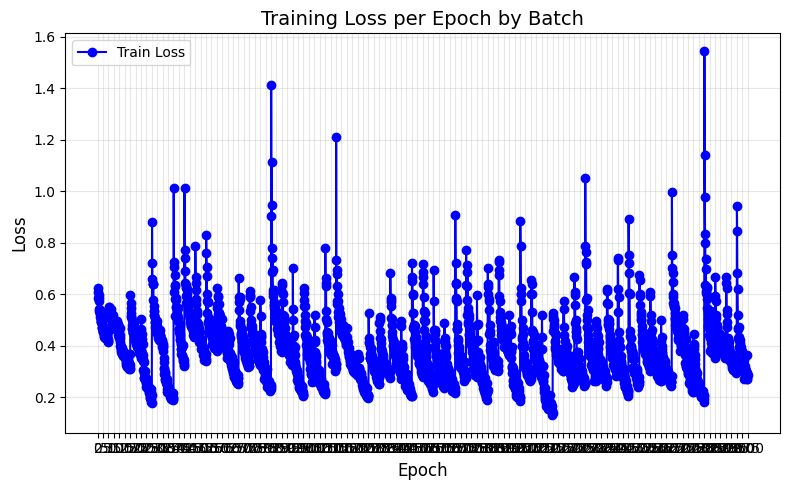

In [37]:
epochs = range(1, len(training_losses) + 1)

plt.figure(figsize=(8, 5))
plt.plot(epochs, training_losses, marker='o', linestyle='-', color='b', label='Train Loss')
plt.title('Training Loss per Epoch by Batch', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)

# Set x-axis ticks at every 25 epochs
plt.xticks(range(0, len(training_losses) + 1, 25))

plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


## Model Evaluation

### Pixel Based Evaluation

In [ ]:
from sklearn.metrics import jaccard_score, f1_score, accuracy_score, matthews_corrcoef

# Function to compute weighted metrics
def compute_weighted_metrics(y_true, y_pred):
    """
    Compute weighted IoU, Dice, Accuracy, and MCC based on class pixel distribution.
    
    Parameters:
        y_true (np.array): Ground truth binary mask (0 or 1).
        y_pred (np.array): Predicted binary mask (0 or 1).
    
    Returns:
        dict: Weighted metrics (IoU, Dice, Accuracy, MCC).
    """
    # Flatten arrays
    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()
    
    # Compute class weights
    total_pixels = len(y_true_flat)
    class_0_weight = np.sum(y_true_flat == 0) / total_pixels  # Background
    class_1_weight = np.sum(y_true_flat == 1) / total_pixels  # Foreground (object)
    
    # Compute metrics for each class
    iou_class_0 = jaccard_score(y_true_flat, y_pred_flat, pos_label=0)
    iou_class_1 = jaccard_score(y_true_flat, y_pred_flat, pos_label=1)
    dice_class_0 = f1_score(y_true_flat, y_pred_flat, pos_label=0)
    dice_class_1 = f1_score(y_true_flat, y_pred_flat, pos_label=1)
    
    # Weighted metrics
    weighted_iou = class_0_weight * iou_class_0 + class_1_weight * iou_class_1
    weighted_dice = class_0_weight * dice_class_0 + class_1_weight * dice_class_1
    
    # Overall metrics
    acc = accuracy_score(y_true_flat, y_pred_flat)
    mcc = matthews_corrcoef(y_true_flat, y_pred_flat)
    
    return weighted_iou, weighted_dice, acc, mcc

In [42]:

def evaluation_batch(current_index ,test_range):

    current_segment_scores = [[], [], [], []]
    #Data preprocessing
    grey = cleaning_mask(current_index)
    color3 = convert_img_to_arr(current_index)
    #Segmentation
    segmented_images_a, segmented_images_na = slic_segmentation(current_index,30,color3, grey)
    final_seg = combine_segmentation(segmented_images_a, segmented_images_na)

    #Beginning sample graph!

    indices,graphs = sample_graph(final_seg,test_range, color3, grey)

    #Beginning Feature extract

    feature_xtract_and_label_assign(final_seg,segmented_images_a,indices, graphs,color3)

    #Creating Custom graph!
    
    test_data = CustomGraphDataset(graphs)


    #Dividing them into batches!
    
    test_loader = DataLoader(test_data, batch_size=5, shuffle=True)

    #Beginning training!
    accuracy, test_loss = eval_model(model, test_loader)


    for idx in range(len(grey)):
        grey_binary = grey[idx].astype(np.uint8)
        prediction_mask = pixel_based_segment(model, final_seg[idx], graphs[idx],test_data[idx])
        segment_metrics = compute_weighted_metrics(grey_binary, prediction_mask)

        for i, value in enumerate(segment_metrics):
            current_segment_scores[i].append(value)

        print(idx)

        #print(grey[idx])
        print(grey_binary)
        print(prediction_mask)

        fig,ax = plt.subplots(1,3,figsize = (13,13))
        ax[0].imshow(color3[idx])
        ax[1].imshow(grey[idx])
        ax[2].imshow(prediction_mask)
        plt.show()

    current_index += 10
    
    del color3, grey, segmented_images_a, segmented_images_na, indices, graphs, test_data, test_loader, final_seg

    return current_index, accuracy, current_segment_scores, test_loss


feature extract and labeling class: 100%|██████████| 10/10 [06:10<00:00, 37.86s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Number of nodes: 28
Number of nodes: 27
Number of nodes: 25
Number of nodes: 23
Number of nodes: 21
Number of nodes: 28
Number of nodes: 22
Number of nodes: 23
Number of nodes: 32
Number of nodes: 26
Accuracy: 63.1373, correct: 161, total: 255



Creating prediction mask:  54%|█████▎    | 15/28 [00:00<00:00, 136.94it/s]
                                                                          

0
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


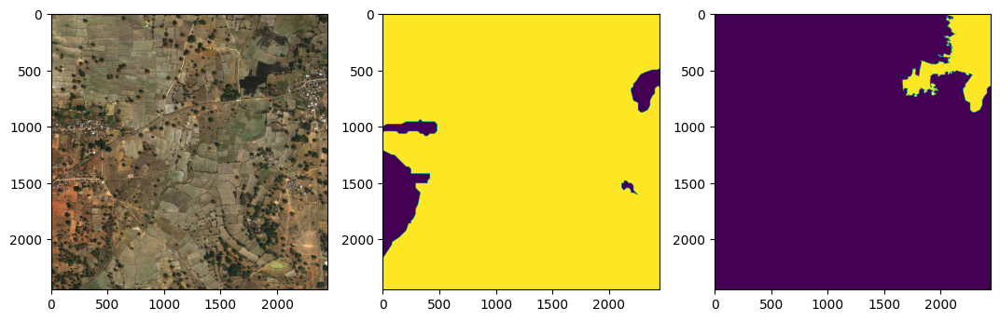


Creating prediction mask:  56%|█████▌    | 15/27 [00:00<00:00, 142.17it/s]
                                                                          

1
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


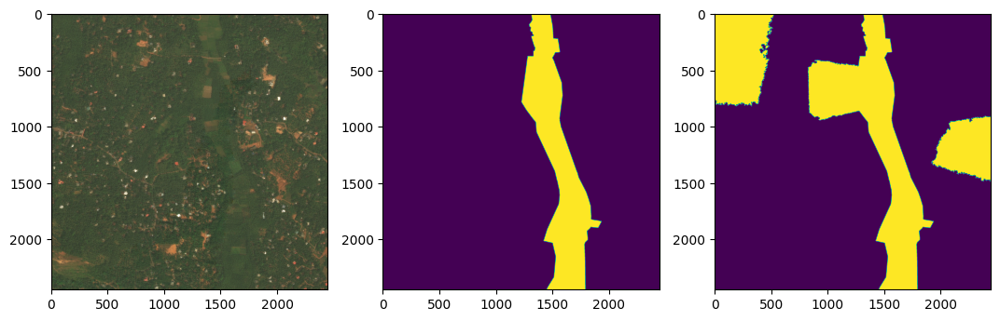


Creating prediction mask:  60%|██████    | 15/25 [00:00<00:00, 143.76it/s]
                                                                          

2
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]


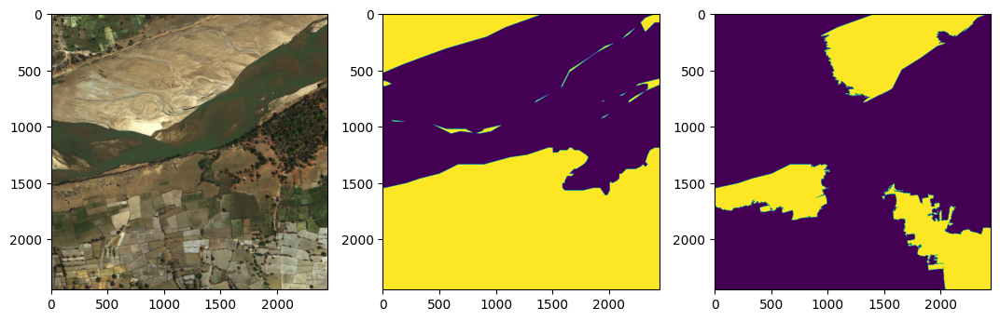


Creating prediction mask:  65%|██████▌   | 15/23 [00:00<00:00, 145.71it/s]
                                                                          

3
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


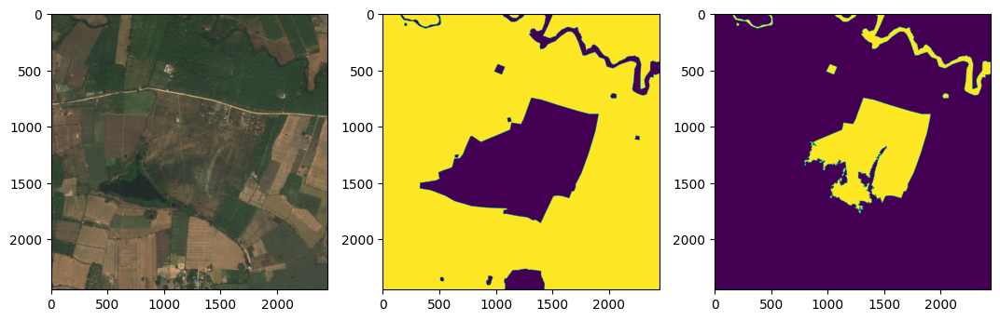


Creating prediction mask:  71%|███████▏  | 15/21 [00:00<00:00, 142.61it/s]
                                                                          

4
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


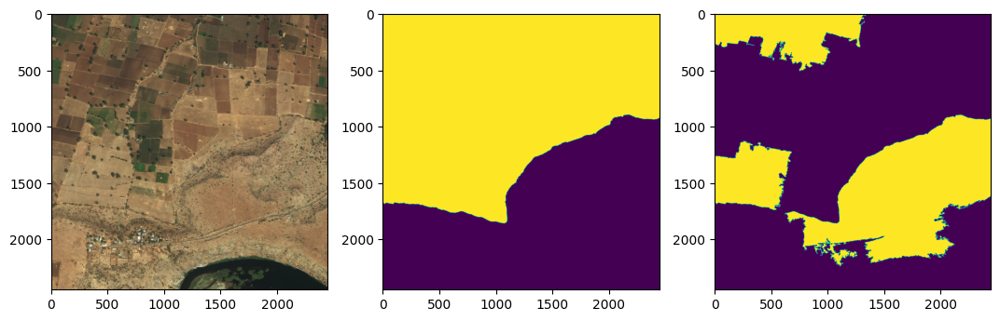


Creating prediction mask:  54%|█████▎    | 15/28 [00:00<00:00, 140.63it/s]
                                                                          

5
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


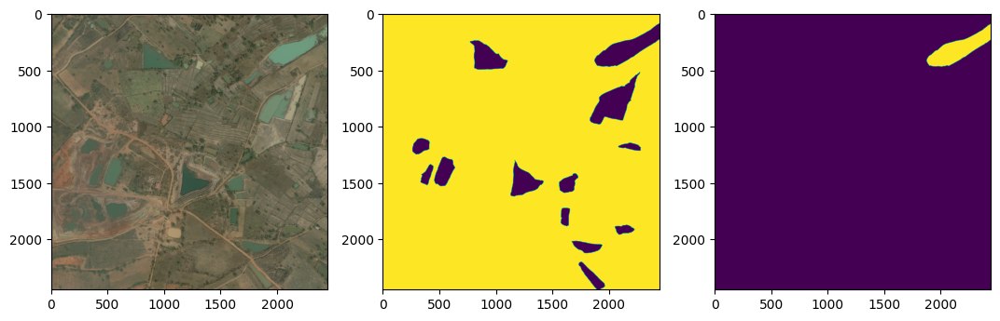


Creating prediction mask:  68%|██████▊   | 15/22 [00:00<00:00, 145.06it/s]
                                                                          

6
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 ...
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]]
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


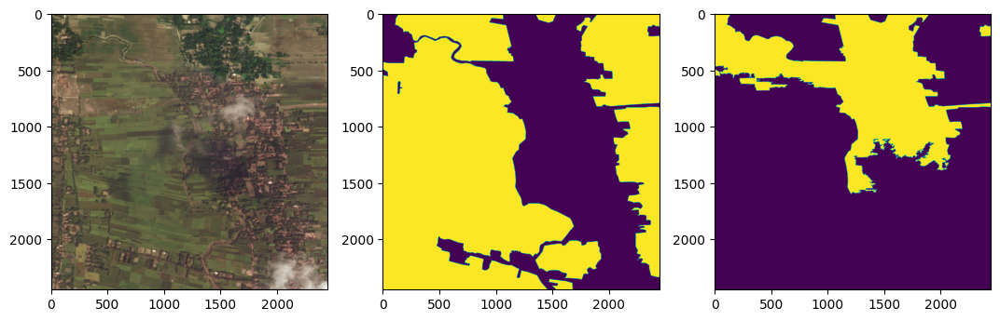


Creating prediction mask:  65%|██████▌   | 15/23 [00:00<00:00, 144.02it/s]
                                                                          

7
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


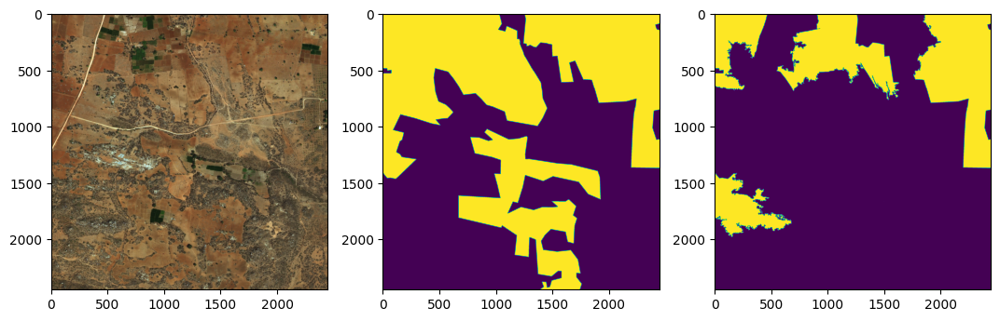


Creating prediction mask:  94%|█████████▍| 30/32 [00:00<00:00, 143.20it/s]
                                                                          

8
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


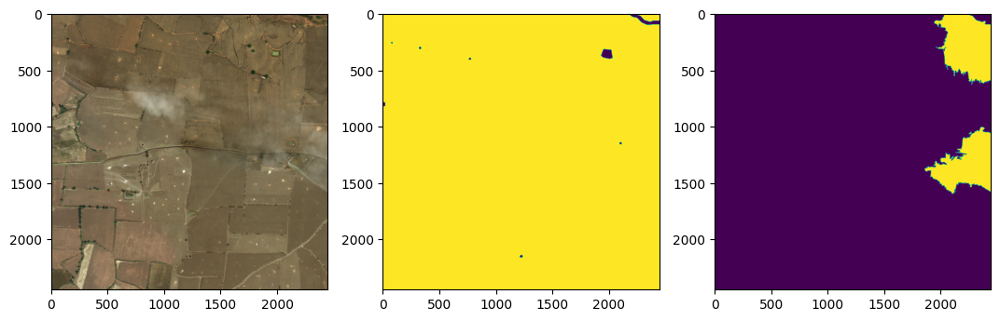


Creating prediction mask:  58%|█████▊    | 15/26 [00:00<00:00, 148.31it/s]
                                                                          

9
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]]


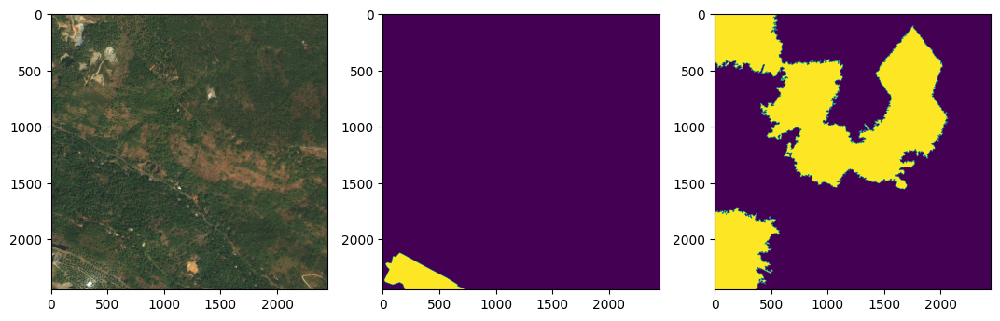

feature extract and labeling class: 100%|██████████| 10/10 [06:31<00:00, 38.48s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Number of nodes: 26
Number of nodes: 29
Number of nodes: 27
Number of nodes: 31
Number of nodes: 28
Number of nodes: 24
Number of nodes: 21
Number of nodes: 25
Number of nodes: 25
Number of nodes: 29
Accuracy: 81.1321, correct: 215, total: 265



Creating prediction mask:  54%|█████▍    | 14/26 [00:00<00:00, 136.16it/s]
                                                                          

0
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


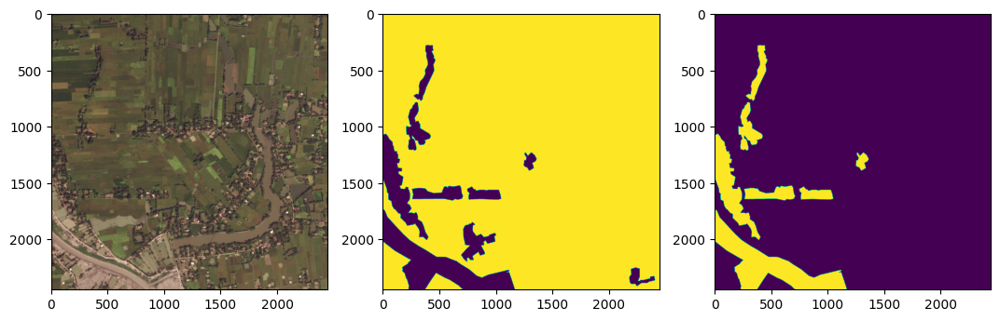


Creating prediction mask:  55%|█████▌    | 16/29 [00:00<00:00, 150.31it/s]
                                                                          

1
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


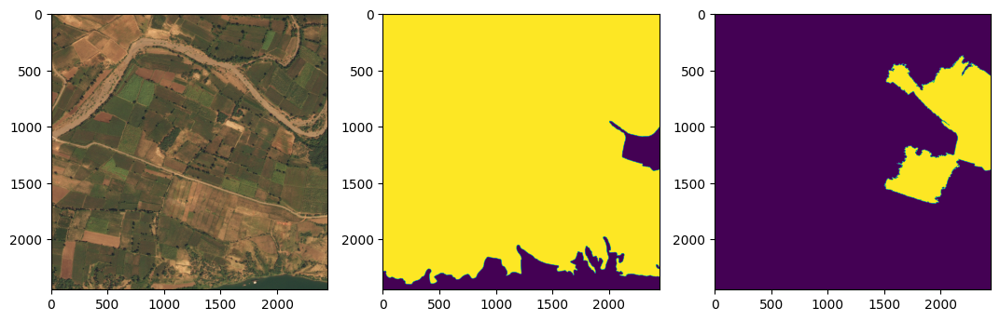


Creating prediction mask:  56%|█████▌    | 15/27 [00:00<00:00, 143.69it/s]
                                                                          

2
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


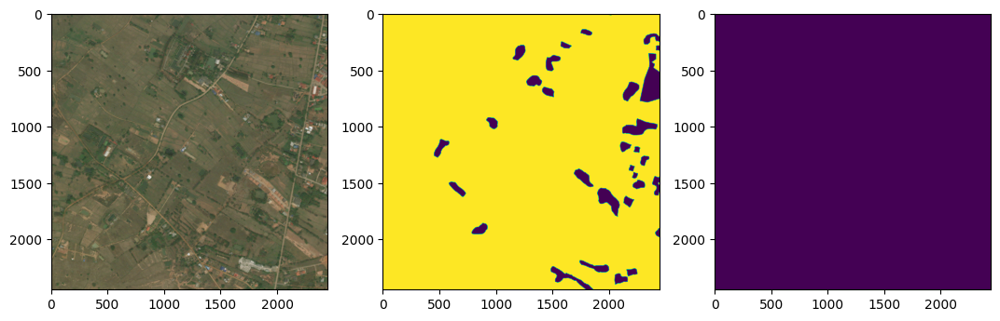


Creating prediction mask:  97%|█████████▋| 30/31 [00:00<00:00, 140.10it/s]
                                                                          

3
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


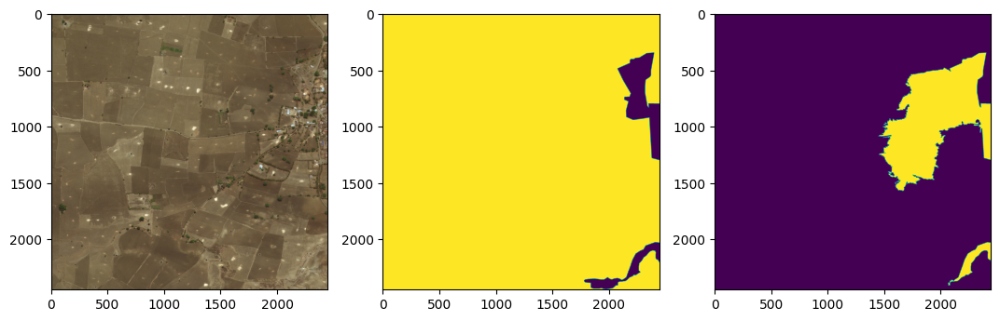


Creating prediction mask:  54%|█████▎    | 15/28 [00:00<00:00, 148.24it/s]
                                                                          

4
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


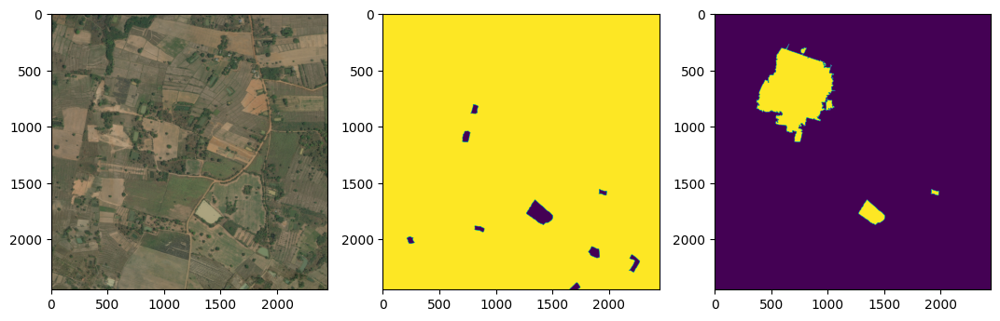


Creating prediction mask:  62%|██████▎   | 15/24 [00:00<00:00, 145.61it/s]
                                                                          /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Jaccard is ill-defined and being set to 0.0 due to no true or predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


5
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


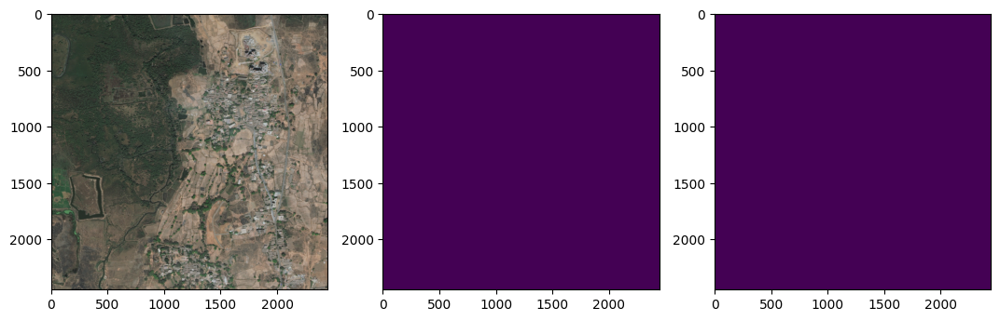


Creating prediction mask:  71%|███████▏  | 15/21 [00:00<00:00, 141.56it/s]
                                                                          

6
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


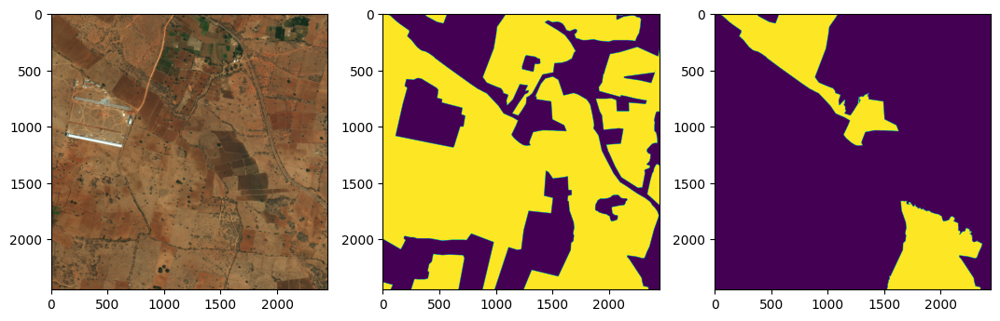


Creating prediction mask:  60%|██████    | 15/25 [00:00<00:00, 144.83it/s]
                                                                          

7
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


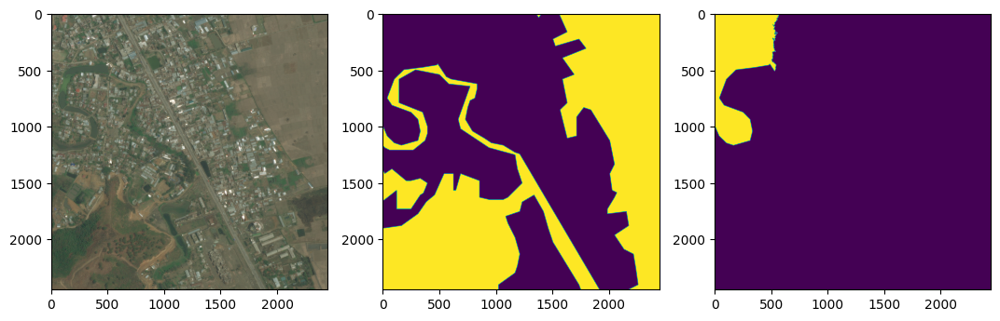


Creating prediction mask:  60%|██████    | 15/25 [00:00<00:00, 140.13it/s]
                                                                          

8
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


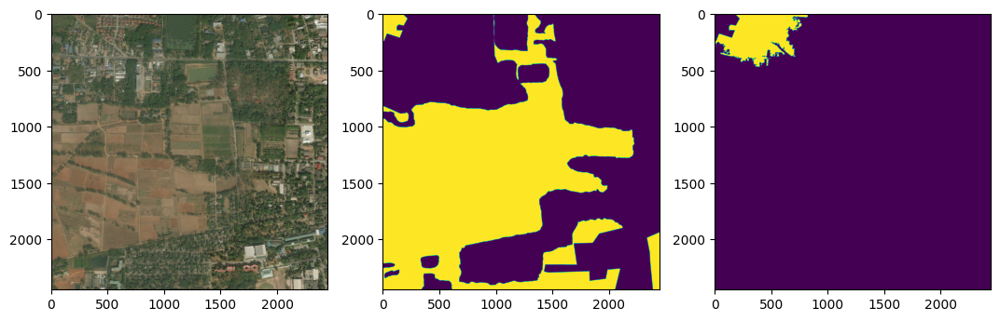


Creating prediction mask:  52%|█████▏    | 15/29 [00:00<00:00, 142.99it/s]
                                                                          

9
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


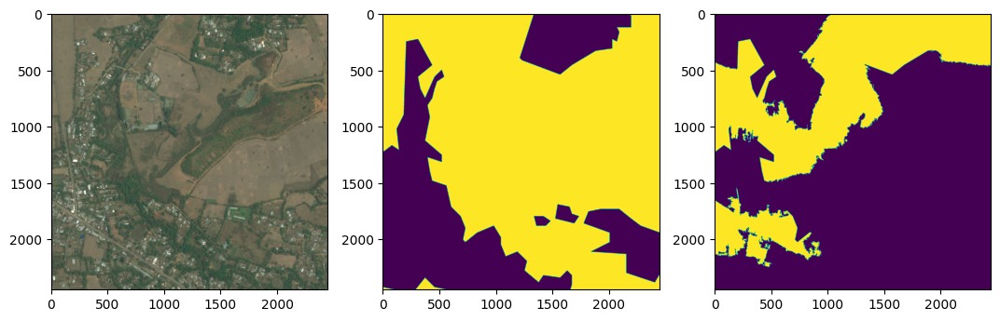

feature extract and labeling class: 100%|██████████| 10/10 [06:15<00:00, 40.66s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Number of nodes: 28
Number of nodes: 28
Number of nodes: 23
Number of nodes: 19
Number of nodes: 25
Number of nodes: 24
Number of nodes: 28
Number of nodes: 24
Number of nodes: 27
Number of nodes: 33
Accuracy: 85.3282, correct: 221, total: 259



Creating prediction mask:  54%|█████▎    | 15/28 [00:00<00:00, 148.38it/s]
                                                                          

0
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


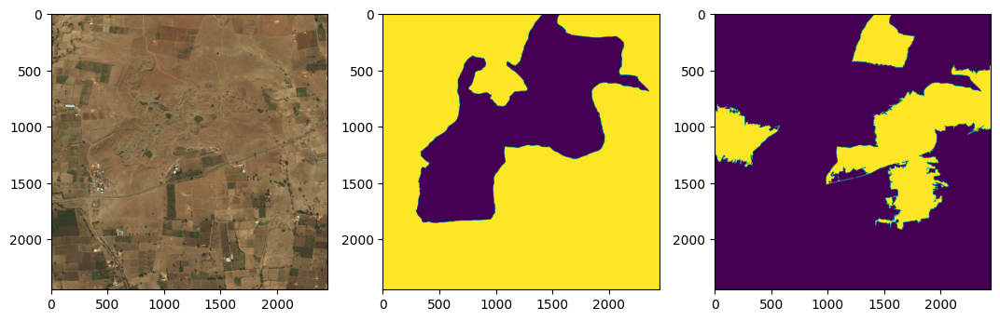


Creating prediction mask:  54%|█████▎    | 15/28 [00:00<00:00, 143.98it/s]
                                                                          

1
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


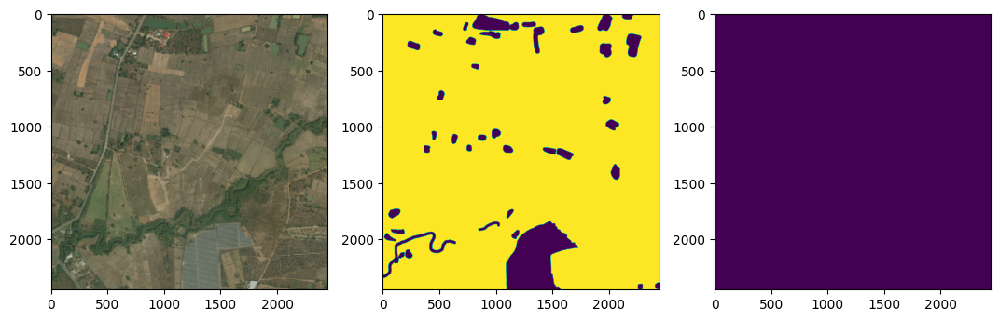


Creating prediction mask:  70%|██████▉   | 16/23 [00:00<00:00, 150.47it/s]
                                                                          

2
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


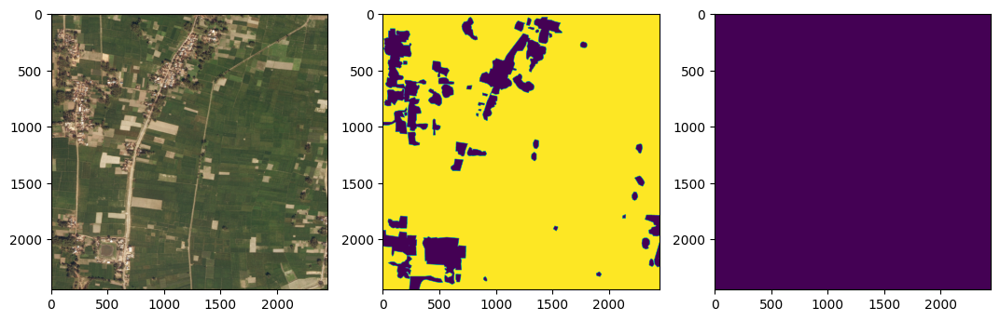


Creating prediction mask:  84%|████████▍ | 16/19 [00:00<00:00, 153.93it/s]
                                                                          

3
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


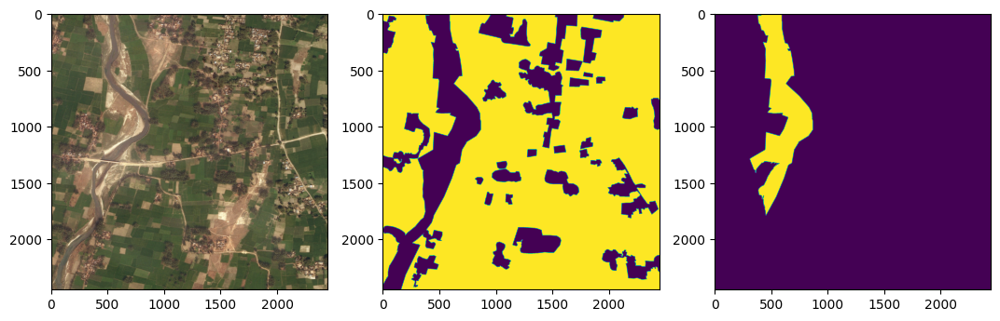


Creating prediction mask:  60%|██████    | 15/25 [00:00<00:00, 148.67it/s]
                                                                          

4
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


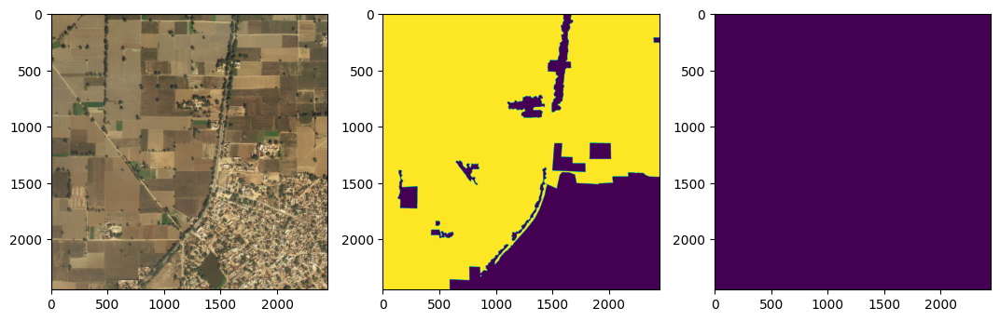


Creating prediction mask:  62%|██████▎   | 15/24 [00:00<00:00, 149.48it/s]
                                                                          

5
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


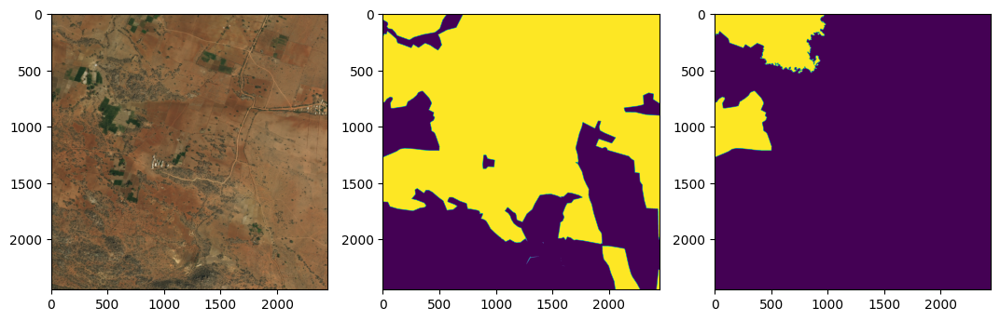


Creating prediction mask:  57%|█████▋    | 16/28 [00:00<00:00, 150.28it/s]
                                                                          

6
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


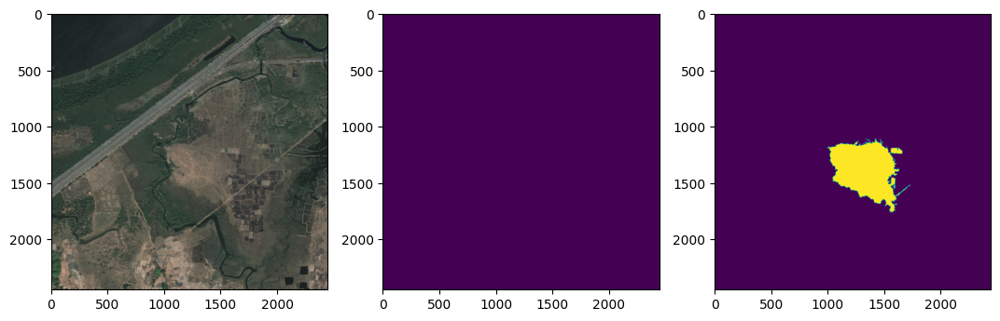


Creating prediction mask:  62%|██████▎   | 15/24 [00:00<00:00, 145.42it/s]
                                                                          

7
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


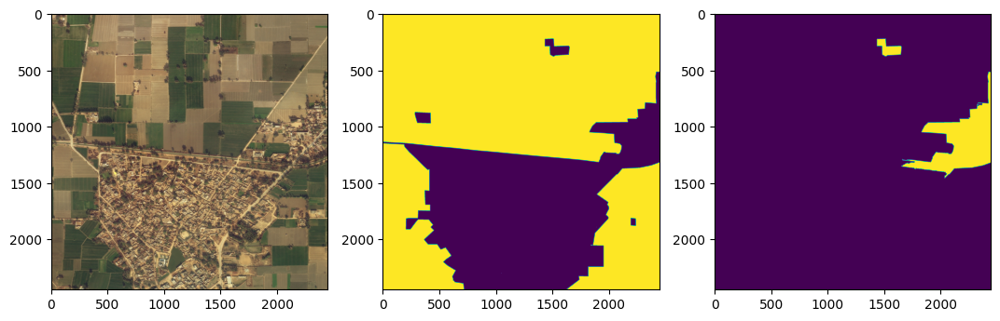


Creating prediction mask:  56%|█████▌    | 15/27 [00:00<00:00, 148.24it/s]
                                                                          

8
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


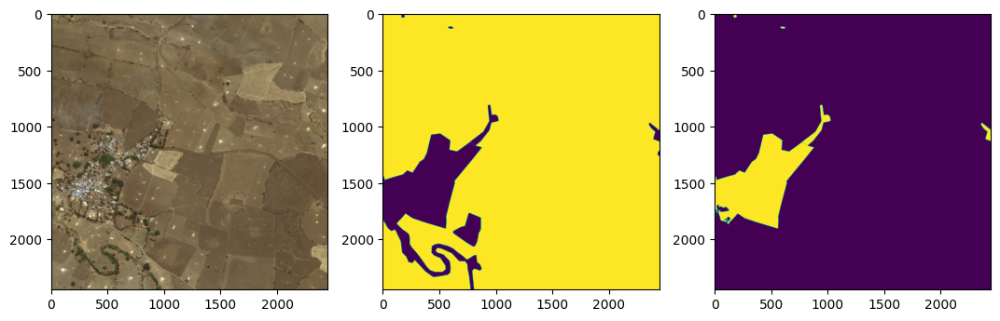


Creating prediction mask:  91%|█████████ | 30/33 [00:00<00:00, 145.16it/s]
                                                                          

9
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


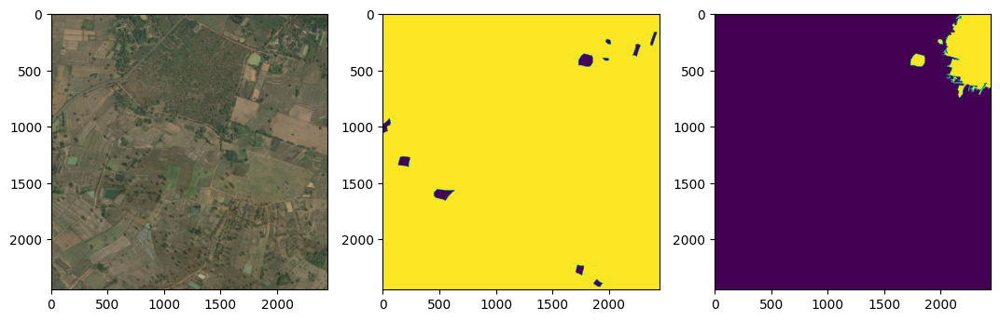

feature extract and labeling class: 100%|██████████| 10/10 [06:02<00:00, 38.41s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Number of nodes: 22
Number of nodes: 27
Number of nodes: 23
Number of nodes: 24
Number of nodes: 25
Number of nodes: 28
Number of nodes: 26
Number of nodes: 15
Number of nodes: 30
Number of nodes: 31
Accuracy: 67.7291, correct: 170, total: 251



Creating prediction mask:  68%|██████▊   | 15/22 [00:00<00:00, 146.48it/s]
                                                                          

0
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


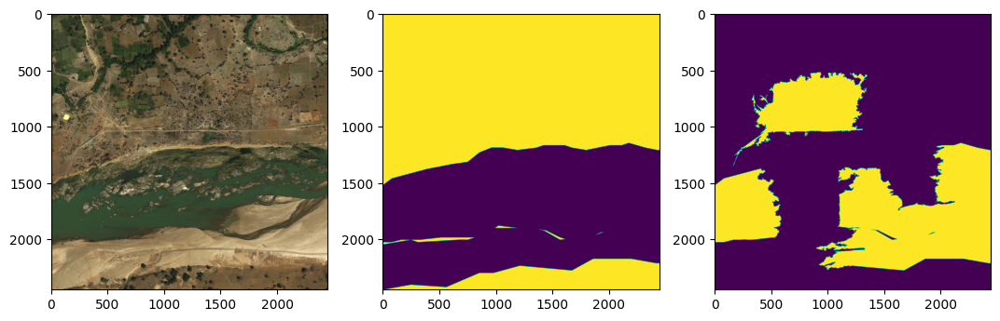


Creating prediction mask:  56%|█████▌    | 15/27 [00:00<00:00, 147.69it/s]
                                                                          

1
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


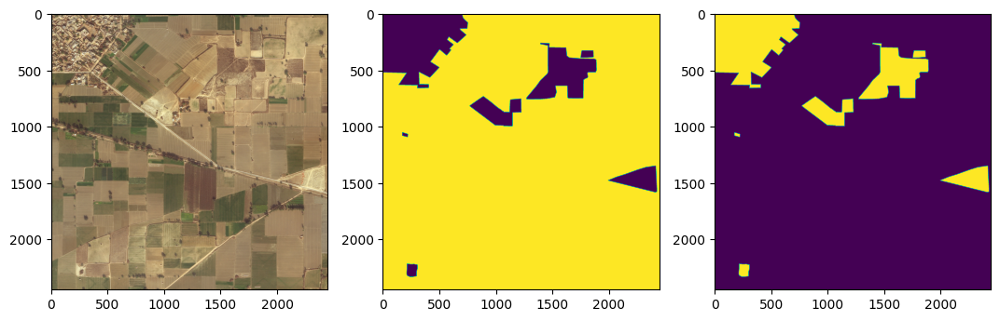


Creating prediction mask:  70%|██████▉   | 16/23 [00:00<00:00, 152.05it/s]
                                                                          

2
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


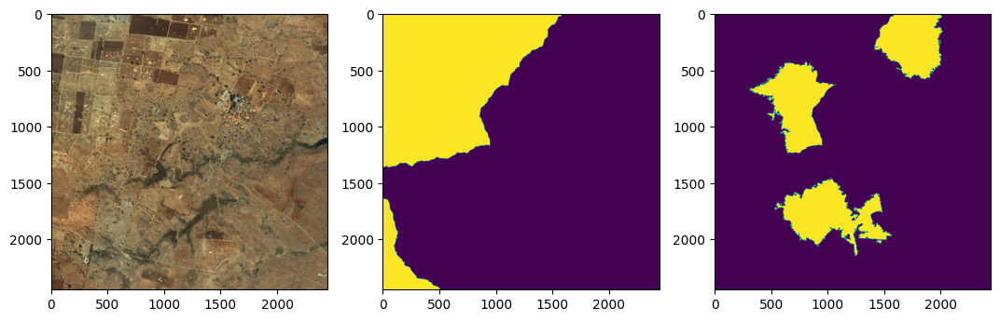


Creating prediction mask:  67%|██████▋   | 16/24 [00:00<00:00, 151.68it/s]
                                                                          

3
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]]
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 ...
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]


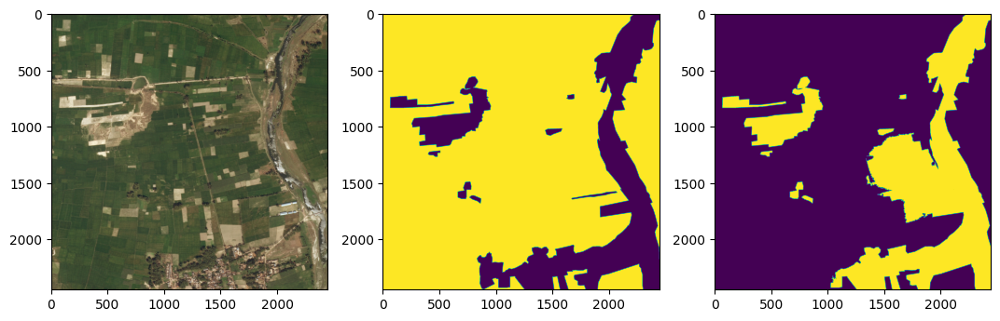


Creating prediction mask:  60%|██████    | 15/25 [00:00<00:00, 149.08it/s]
                                                                          /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Jaccard is ill-defined and being set to 0.0 due to no true or predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


4
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


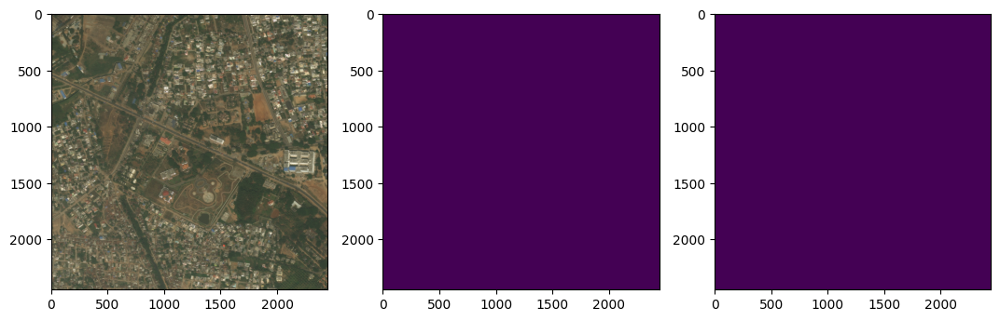


Creating prediction mask:  54%|█████▎    | 15/28 [00:00<00:00, 147.83it/s]
                                                                          

5
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


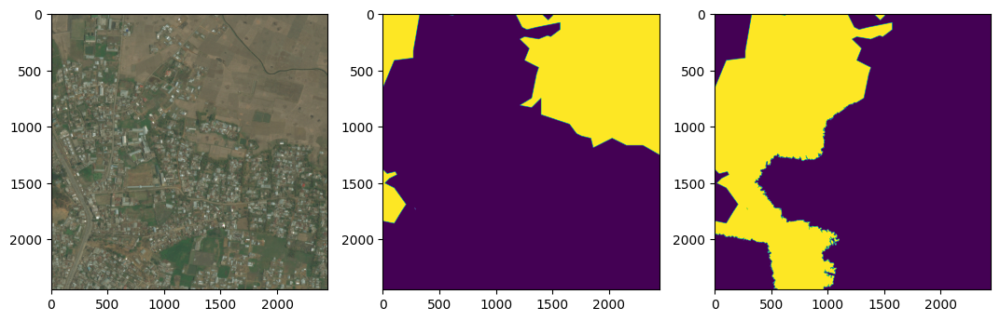


Creating prediction mask:  62%|██████▏   | 16/26 [00:00<00:00, 154.21it/s]
                                                                          

6
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


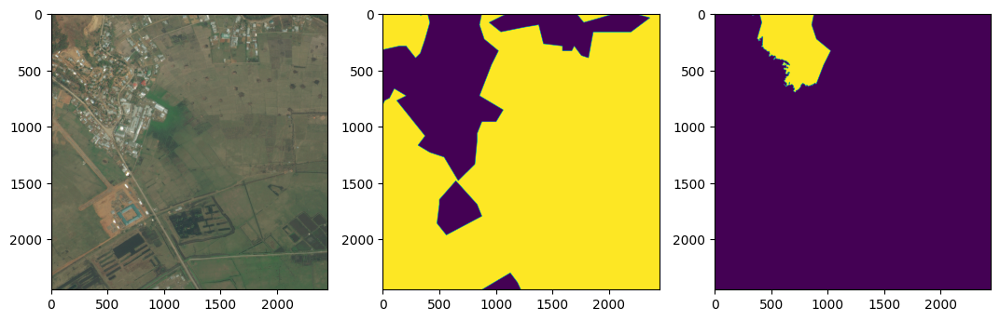


Creating prediction mask: 100%|██████████| 15/15 [00:00<00:00, 148.70it/s]
                                                                          

7
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


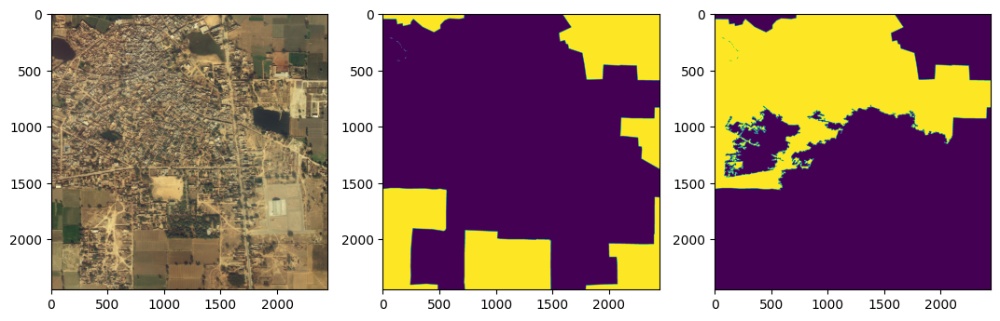


Creating prediction mask:  53%|█████▎    | 16/30 [00:00<00:00, 152.77it/s]
                                                                          

8
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


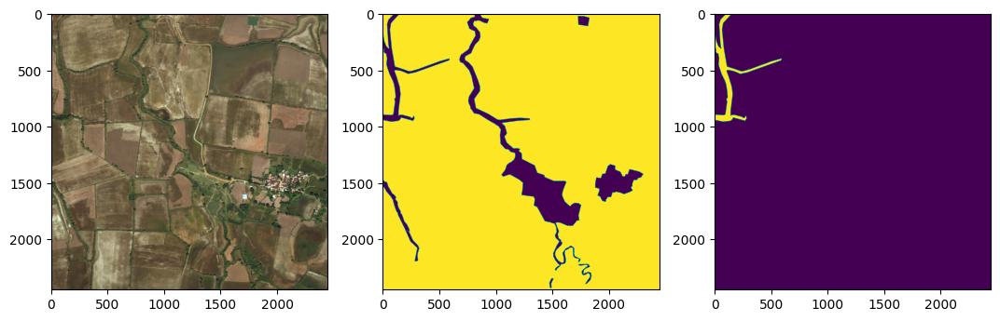


Creating prediction mask: 100%|██████████| 31/31 [00:00<00:00, 150.76it/s]
                                                                          

9
[[1 0 0 ... 0 0 0]
 [1 1 0 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]
[[0 1 1 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


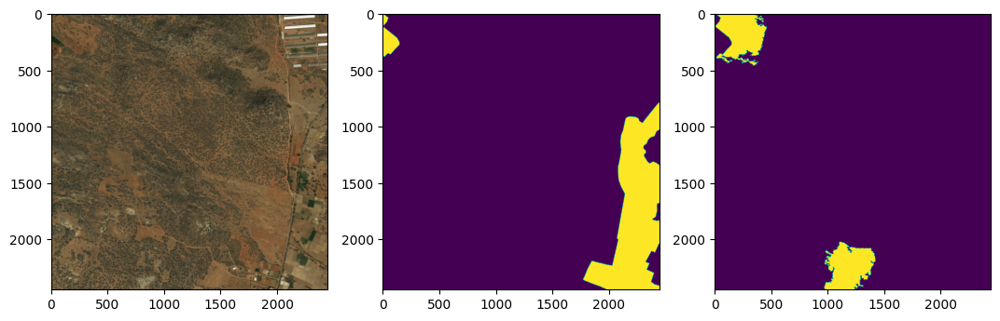

feature extract and labeling class: 100%|██████████| 10/10 [05:57<00:00, 34.33s/it]
                                                                                   /usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Number of nodes: 20
Number of nodes: 27
Number of nodes: 26
Number of nodes: 31
Number of nodes: 32
Number of nodes: 26
Number of nodes: 18
Number of nodes: 21
Number of nodes: 21
Number of nodes: 26
Accuracy: 81.4516, correct: 202, total: 248



Creating prediction mask:  75%|███████▌  | 15/20 [00:00<00:00, 144.63it/s]
                                                                          /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Jaccard is ill-defined and being set to 0.0 due to no true or predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


0
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


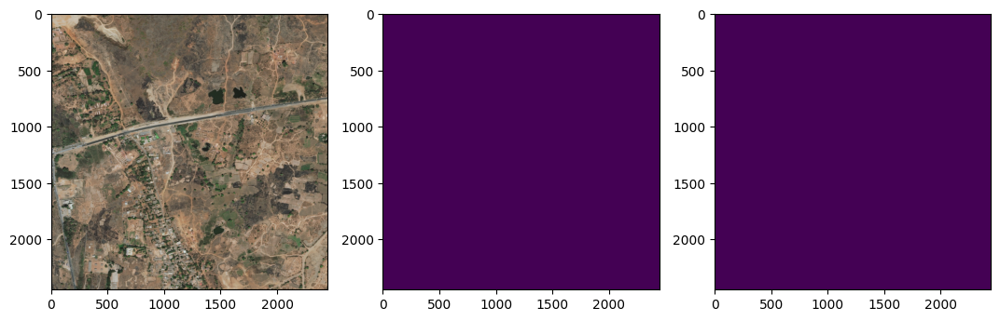


Creating prediction mask:  56%|█████▌    | 15/27 [00:00<00:00, 148.00it/s]
                                                                          

1
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


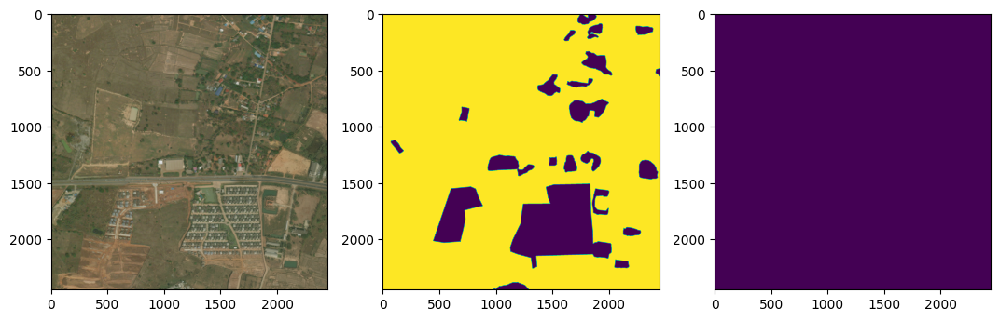


Creating prediction mask:  58%|█████▊    | 15/26 [00:00<00:00, 148.83it/s]
                                                                          

2
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


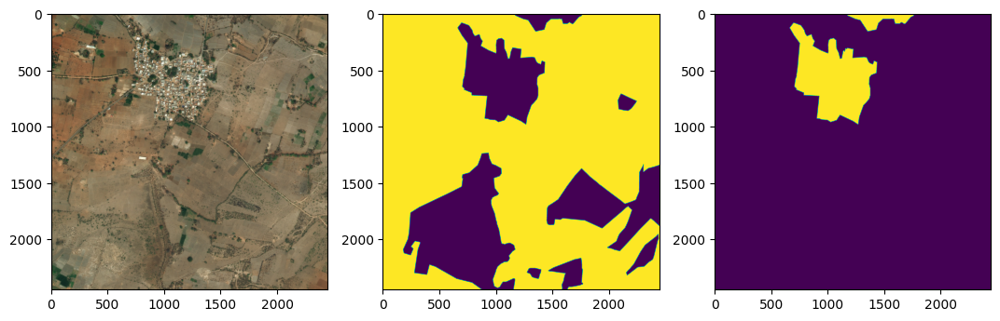


Creating prediction mask:  97%|█████████▋| 30/31 [00:00<00:00, 146.91it/s]
                                                                          

3
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]]
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]


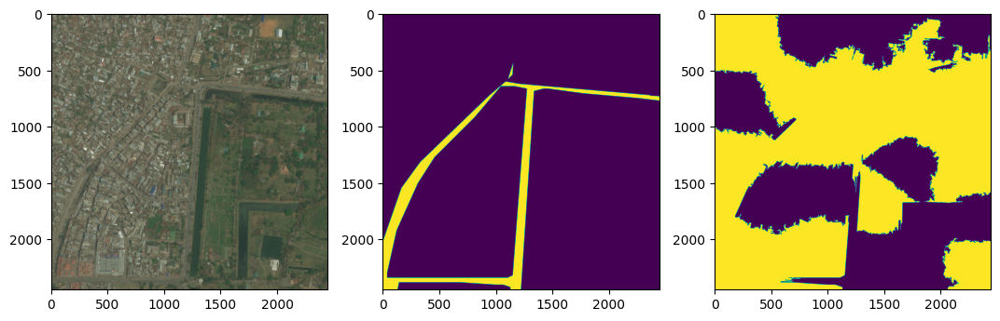


Creating prediction mask:  88%|████████▊ | 28/32 [00:00<00:00, 139.87it/s]
                                                                          

4
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 ...
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


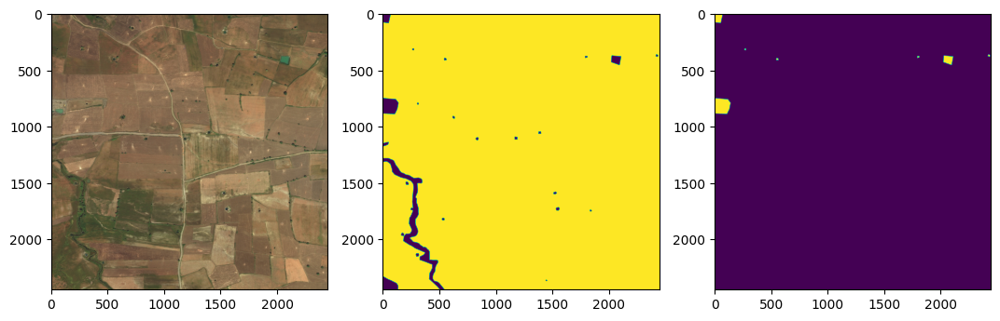


Creating prediction mask:  58%|█████▊    | 15/26 [00:00<00:00, 144.86it/s]
                                                                          

5
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


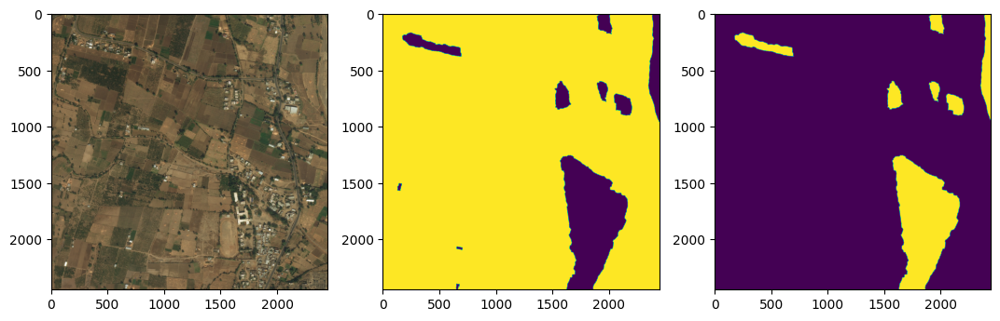


Creating prediction mask:  78%|███████▊  | 14/18 [00:00<00:00, 136.52it/s]
                                                                          

6
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


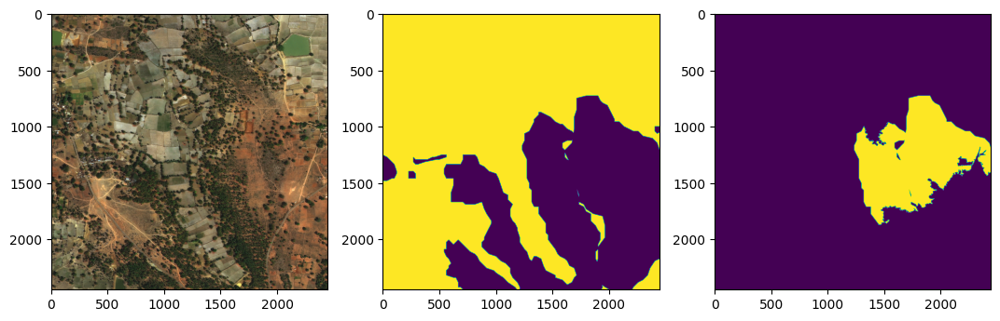


Creating prediction mask:  71%|███████▏  | 15/21 [00:00<00:00, 142.98it/s]
                                                                          

7
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


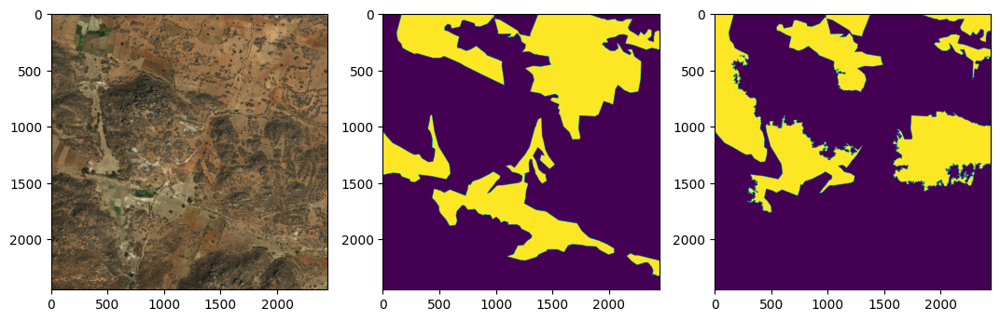


Creating prediction mask:  62%|██████▏   | 13/21 [00:00<00:00, 123.73it/s]
                                                                          

8
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


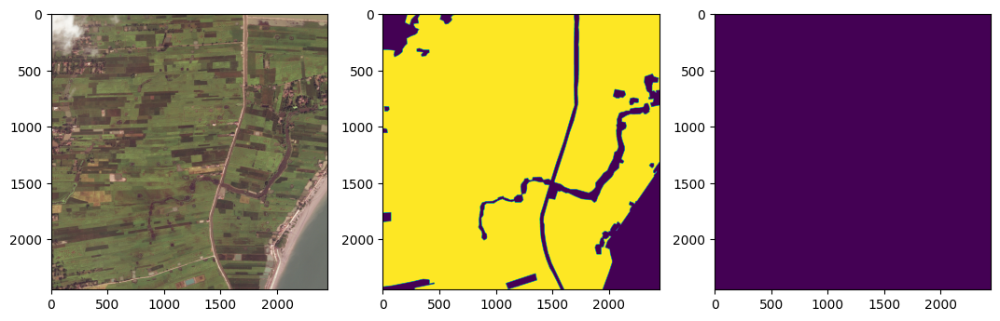


Creating prediction mask:  58%|█████▊    | 15/26 [00:00<00:00, 142.12it/s]
                                                                          

9
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


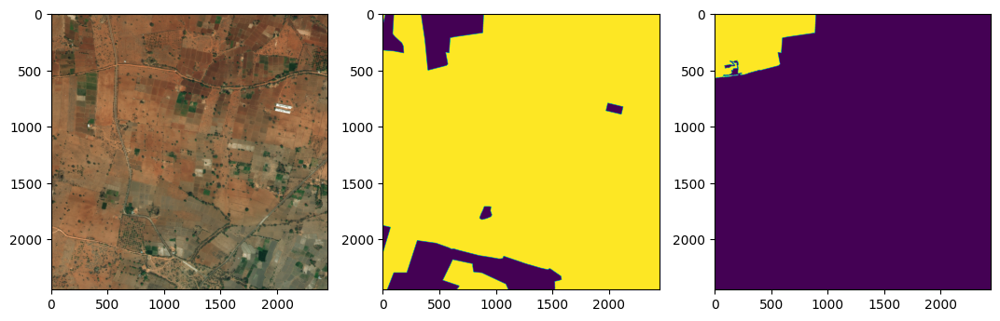

evaluation_pipeline: 100%|██████████| 5/5 [57:30<00:00, 690.02s/it]


In [43]:
scores = []
test_losses = []
eval_index = 500

batches_num = 0
segmentation_scores = np.array([0, 0, 0, 0], dtype=float)
for i in tqdm(range(600, 650, 10), desc='evaluation_pipeline'):

   
    curr_idx, acc, segment_metrics, test_loss = evaluation_batch(eval_index ,10)
    # Update the scores list by adding the list values
    #for idx, value in enumerate(segment_metrics):
    #    segment_scores[idx].append(value)
    avg_segment_scores = np.array([np.mean(i) for i in segment_metrics])
    
    segmentation_scores += avg_segment_scores
    test_losses.append(test_loss)
    batches_num += 1

    
    
    scores.append(acc)
    eval_index = curr_idx

### Node based Evaluation

In [44]:
print(segmentation_scores)
print(scores)

[ 1.15051126  1.43905381  1.58541193 -1.26885023]
[63.13725490196078, 81.13207547169812, 85.32818532818533, 67.72908366533864, 81.45161290322581]


In [46]:
print(scores)
avg = sum(scores)/len(scores)
print(f'Average Accuracy: {avg}')

all_segmentation_scores = [i/batches_num for i in segmentation_scores]

[63.13725490196078, 81.13207547169812, 85.32818532818533, 67.72908366533864, 81.45161290322581]
Average Accuracy: 75.75564245408174


In [47]:
metrics = ['Weighted IoU', 'Weighted Dice', 'Accuracy', 'MCC']
for metric, score in zip(metrics, all_segmentation_scores):
    print(f"{metric}: {score:.8f}")

Weighted IoU: 0.23010225
Weighted Dice: 0.28781076
Accuracy: 0.31708239
MCC: -0.25377005


In [48]:
print(test_losses)

[0.6747020781040192, 0.4330298900604248, 0.37584568560123444, 0.5809677243232727, 0.4963216036558151]


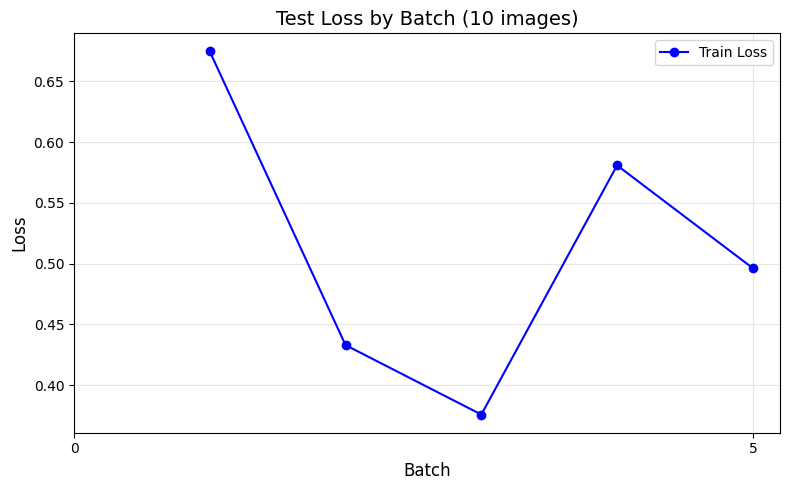

In [49]:
test_batch = range(1, len(test_losses) + 1)

plt.figure(figsize=(8, 5))
plt.plot(test_batch, test_losses, marker='o', linestyle='-', color='b', label='Train Loss')
plt.title('Test Loss by Batch (10 images)', fontsize=14)
plt.xlabel('Batch', fontsize=12)
plt.ylabel('Loss', fontsize=12)

# Set x-axis ticks at every 25 epochs
plt.xticks(range(0, len(test_losses) + 1, 5))

plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

## Test Prediction

In [50]:
def feature_extract(segment, img):
    featuremap = {}
    si = segment
    c = img

    #instantiate regions
    regions = np.unique(si)

    #create looping of regions for isolation
    for i in range(len(regions)):

        #isolate region
        sp = si == i
        sptw = mark_boundaries(c,si)

        #Anything outside the region will be 0 valued
        sptw[~sp] = 0

        #resize the image for feature extraction
        sptw = cv2.resize(sptw,(512,512))
        #rearrange image for resnet50
        sptw = sptw.reshape(1,sptw.shape[0],sptw.shape[1],sptw.shape[2])
        sptw = preprocess_input(sptw)

        #Append feature values
        features = resnetModel.predict(sptw)
        featuremap[f'Region {i + 1}'] = features

    return featuremap


def segment_image(img_path):
    img = img_as_float(io.imread(img_path))
    segments = segmentation.slic(img, n_segments=30, start_label=1)
    return segments, img

def graph_image(img_path):
    seg, img = segment_image(img_path)
    edges = find_boundaries(seg, mode='inner').astype(np.float64)
    graphs = graph.rag_boundary(seg, edges, connectivity=1)
    pooled_features = apply_gmp(feature_extract(seg, img))
    add_fmap(graphs, pooled_features)

    return graphs

def apply_gmp(featuremap):
    pooled_extracted_features = []
    for features in featuremap:
      features = torch.tensor(featuremap[features], dtype=torch.float)
      features = features.permute(0, 3, 1, 2)
      gmp = torch.nn.AdaptiveAvgPool2d(1)  # Create GMP layer
      pooled_features = gmp(features).squeeze(-1).squeeze(-1)
      #print(pooled_features.shape)  # Remove H and W dimensions
      #avg_features = torch.mean(features, dim=1)
      #pooled_features = [torch.mean(i[0]) for i in pooled_features]

      #avg = torch.sum(pooled_features, dim=0, keepdim=True)

      pooled_extracted_features.append(pooled_features[0])

    return pooled_extracted_features


def add_fmap(graph, features):
    # Adding the features with respect to its node
    for node in graph.nodes:
        graph.nodes[node]['Features'] = features[node-1]

In [51]:
def graph_to_tensor(temp_graph):
    nodes = []
    for node, attributes in temp_graph.nodes(data=True):
        nodes.append(temp_graph.nodes[node]['Features'])

    edges = np.array(list(temp_graph.edges))  # Extract edges as a numpy array
    edges = edges-1
    edge_index = edges.T
    edge_index


    # Node features (4 nodes, 2 features each)
    x = torch.tensor(np.array(nodes), dtype=torch.float)
    #x = x.view(x.shape[0] , -1)

    edge_index = torch.tensor(edge_index, dtype=torch.long)


    #Checking if edge_index matches with the number of nodes
    if edge_index.max().item() >= x.shape[0]:
        raise ValueError(f"Edge index exceeds the number of nodes ({x.shape[0]}). Max index: {edge_index.max().item()}")

    temp_data = Data(x=x, edge_index=edge_index)

    #temp_data = transform(temp_data)
    return temp_data #Return a Data Object

In [70]:
sig = torch.nn.Sigmoid()


def predict(temp_data):
  model.eval()  # Set the model to evaluation mode
  with torch.no_grad():  # Disable gradient calculations during evaluation
    out =  model(graph_to_tensor(temp_data))
    sigmoid_ = sig(out)
    prediction = (sigmoid_ > 0.5).float()
    return prediction, sigmoid_

In [53]:


sample_image = '/kaggle/input/capstone/Sat Folder-20250108T123123Z-001/Sat Folder/123172_sat.jpg'

img_samp = graph_image(sample_image)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


In [73]:
prediction, sigmoids = predict(img_samp)
prediction = prediction.squeeze()
simmoids = sigmoids.squeeze()

In [74]:
print(prediction)
print(sigmoids)

tensor([1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
tensor([[7.2987e-01],
        [6.1930e-01],
        [3.5706e-01],
        [2.0928e-01],
        [1.9367e-01],
        [9.9202e-02],
        [1.7741e-01],
        [5.5472e-02],
        [1.6371e-01],
        [5.6739e-02],
        [6.5048e-02],
        [7.5292e-02],
        [8.4202e-02],
        [2.0950e-04]])


### Visualize Prediction

In [79]:
for node in np.unique(img_samp.nodes):

#for i, node in enumerate(img_samp.nodes):
    img_samp.nodes[node]['class'] = prediction[node-1]


In [80]:
print(len(img_samp.nodes))

14


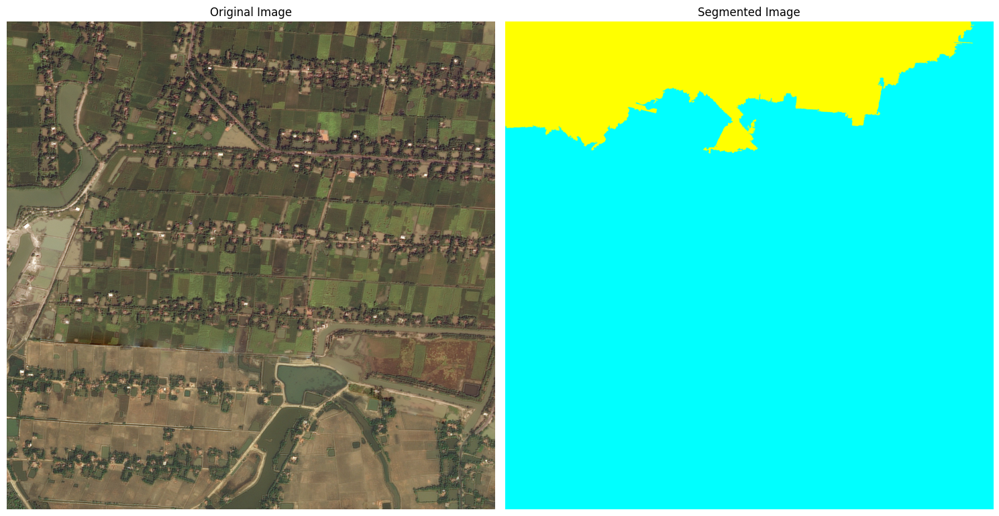

In [81]:
original_image = img_as_float(io.imread(sample_image))

output_image = np.zeros_like(original_image, dtype=np.uint8)

img_segments = segmentation.slic(original_image, n_segments=30, start_label=1)
for segment_id in np.unique(img_segments):
    mask = img_segments == segment_id
    if img_samp.nodes[segment_id]['class'] == 0:
        output_image[mask] = [0, 255, 255]  # Cyan
    else:
        output_image[mask] = [255, 255, 0]  # Yellow

fig, axes = plt.subplots(1, 2, figsize=(15, 15))

# Original image
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[0].axis("off")

# Output image
axes[1].imshow(output_image)
axes[1].set_title('Segmented Image')
axes[1].axis("off")

plt.tight_layout()


In [82]:
from skimage.color import label2rgb


def visualize_segments(segments, image, sigmoids):
    # Get the image corresponding to img_number
    # Find boundaries for the segments and convert them to float64
    edges = find_boundaries(segments, mode='inner').astype(np.float64)
    
    # Mark the boundaries on the image
    mbound = mark_boundaries(image, segments)
    
    # Create an overlay of the image with the segment boundaries marked
    mbound1 = label2rgb(segments, image=mbound, kind='overlay', image_alpha=1, saturation=1)
    
    # Measure the regions in the segmented image
    regions = measure.regionprops(segments)
    
    # Get the centroids of the regions
    centroids = {region.label: region.centroid for region in regions}
    
    # Plot the image with boundaries and centroids
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.imshow(mbound1)
    
    # Add centroids as red text at the respective positions
    for node, (y, x) in centroids.items():
        ax.text(x, y, str(round(sigmoids[node-1], 4)), color='red', fontsize=12, ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.6, edgecolor='none'))
    
    # Show the plot
    plt.show()

In [83]:
print(prediction.squeeze())

tensor([1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])


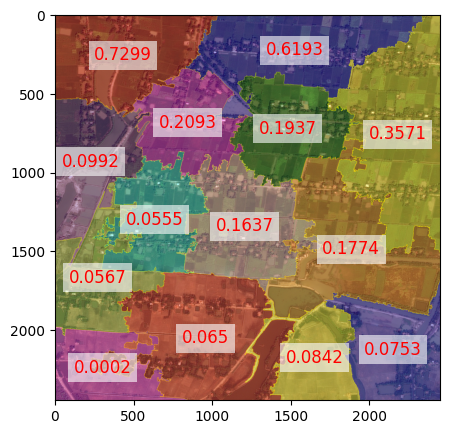

In [84]:
visualize_segments(img_segments, original_image, sigmoid_output)

In [86]:
import torch

# Assume `model` is your PyTorch model
torch.save(model.state_dict(), "model_weights_10img_batch.pth")


In [87]:
torch.save(model, "model_10img_batch.pth")